In [1]:
import pandas as pd
#pd.set_option('display.max_rows', None)
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib import path
import os
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy
import numpy as np
import netCDF4 as nc
np.set_printoptions(threshold=100000)
from shapely.geometry import Polygon, Point, MultiPoint
from shapely.ops import cascaded_union
from datetime import datetime, timedelta
import time
import warnings
import statsmodels.api as sm
import datetime
import math
from scipy.ndimage.interpolation import shift
import shapely.wkt
from scipy.stats import pearsonr,spearmanr,kendalltau

warnings.filterwarnings('ignore')
import seaborn as sns
sns.set(font_scale=1.4) 
from my_functions import sat_vap_press, vap_press, hot_dry_windy, haines

## Helper Function

In [25]:
def scatter_plot(df_plot,x_plot,y_plot,point_hue, point_style, point_size, point_size_range,plot_title):
    fig,ax=plt.subplots(figsize=(10,10))
    sns.scatterplot(data =df_plot, x=x_plot,y=y_plot,hue=point_hue,style=point_style,size=point_size,sizes=point_size_range,ax=ax)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.title(plot_title)
    plt.show()

In [26]:
def scatter_plot_two(df_plot, df_plot_filtered,x_plot,y_plot,point_hue, point_style, point_size, point_size_range,plot_title):
    fig,ax=plt.subplots(figsize=(10,10))
    sns.scatterplot(data =df_plot, x=x_plot,y=y_plot,hue=point_hue,style=point_style,s=650,ax=ax,alpha=0.3, legend=False)
    sns.scatterplot(data=df_plot_filtered, x=x_plot,y=y_plot,hue=point_hue,style=point_style,s=650,sizes=point_size_range,ax=ax)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.title(plot_title)
    plt.show()

In [27]:
def plot_correlations(df_all, fig_title,correlation_type):

    #make the correlation matrix
    corrMatrix = df_all.corr(method=correlation_type)
    
    #plot it
    fig,ax=plt.subplots(figsize=(25,25))
    sns.heatmap(corrMatrix, annot=True,vmin=-1, vmax=1, cmap='seismic', annot_kws={'fontsize':18})
    plt.title(fig_title, fontsize=20)
    plt.show()

## Put all of the cases together

In [2]:
#combine all days, fires
merra_all = pd.DataFrame()
rave_all = pd.DataFrame()
hrrr_gust_all = pd.DataFrame()
hrrr_ws_all = pd.DataFrame()
esi_all = pd.DataFrame()
pws_all = pd.DataFrame()
#cpc_all = pd.DataFrame()
#imerg_all = pd.DataFrame()
igbp_all = pd.DataFrame()
names_all = pd.DataFrame()
resources_all = pd.DataFrame()
fuel_loading_all = pd.DataFrame()
area_all = pd.DataFrame()


fire_incidents = ['AUGUST COMPLEX', 'BOBCAT', 'DOLAN', 'HOLIDAY FARM','CREEK', 'LAKE', 'CAMERON PEAK', 'PINE GULCH']
#fire_incidents = ['AUGUST COMPLEX', 'BOBCAT', 'DOLAN', 'HOLIDAY FARM','CREEK', 'CAMERON PEAK', 'PINE GULCH']
#fire_incidents = ['LAKE']
#fire_incidents=['HOLIDAY FARM']
path_features='/data2/lthapa/ML_daily/fire_features/'
path_poly = '/data2/lthapa/ML_daily/fire_polygons/'
suffix_poly = 'Z_day_start.geojson'
start_time=12
for ii in range(len(fire_incidents)):
    file_prefix = fire_incidents[ii].lower().replace(' ', '_')
    print(file_prefix)
    #load in rave data
    rave_obs = pd.read_csv(path_features+file_prefix+'_Daily_RAVE_'+str(start_time)+'Z_day_start.csv')
    #make it daily
    rave_resampled=rave_obs
    rave_resampled = rave_resampled.set_index(pd.to_datetime(rave_resampled['day'])).drop(columns=['day'])
    rave_resampled=rave_resampled.resample('24H',origin='start').asfreq()
    
    #process some daily changes in FRP
    rave_resampled['Yesterday FRP'] = rave_resampled.Mean_FRP.shift(1)
    #rave_resampled['Absolute dFRP'] = rave_resampled['Mean_FRP']-rave_resampled['Yesterday FRP']
    #rave_resampled['Relative dFRP'] = rave_resampled['Mean_FRP']/rave_resampled['Yesterday FRP']
    #pull out only the days we are worried about
    inds = rave_resampled.index.isin(rave_obs['day'])
    rave_resampled=rave_resampled[inds]
    
    inds_active = np.where(rave_resampled['Mean_FRP']>10)[0] #this is the threshold I used at NOAA
    rave_resampled=rave_resampled.iloc[inds_active]
    #initialize the resources dataframe using the rave index
    resources = pd.DataFrame(index=rave_resampled.index.strftime('%Y-%m-%d'),columns=['personnel','percent_contained'])
    #get the observed resources
    resources_obs = pd.read_csv(path_features+file_prefix+'_Daily_Resources_'+str(start_time)+'Z_day_start.csv')
    
    #fill in the resources with observed for the days we have resource observations and polygons
    inds_fill = np.where(resources.index.isin(resources_obs['day']))[0]
    inds_grab = np.where(resources_obs['day'].isin(resources.index))[0]
    resources['personnel'].iloc[inds_fill] = resources_obs['personnel'].iloc[inds_grab]
    resources['percent_contained'].iloc[inds_fill]=resources_obs['percent_contained'].iloc[inds_grab]
    
    #get the time series for all the fires
    rave=rave_resampled.reset_index()
    resources = resources.reset_index().astype({'personnel': 'float64', 'percent_contained':'float64'})
    
    merra = pd.read_csv(path_features+file_prefix+'_Daily_MERRA_'+str(start_time)+'Z_day_start.csv').iloc[inds_active]
    hrrr_gust = pd.read_csv(path_features+file_prefix+'_Daily_HRRR_'+str(start_time)+'Z_day_start.csv').iloc[inds_active]
    hrrr_ws = pd.read_csv(path_features+file_prefix+'_Daily_HRRR_ws_'+str(start_time)+'Z_day_start.csv').iloc[inds_active]
    pws = pd.read_csv(path_features+file_prefix+'_Daily_PWS_'+str(start_time)+'Z_day_start.csv').iloc[inds_active] 
    igbp = pd.read_csv(path_features+file_prefix+'_Daily_IGBP_'+str(start_time)+'Z_day_start.csv').iloc[inds_active]
    esi = pd.read_csv(path_features+file_prefix+'_Daily_ESI_'+str(start_time)+'Z_day_start.csv').iloc[inds_active]
    fuel_loading = pd.read_csv(path_features+file_prefix+'_Daily_FUEL_LOADING_'+str(start_time)+'Z_day_start.csv').iloc[inds_active]
    area = pd.read_csv(path_features+file_prefix+'_Daily_FIRE_AREA_'+str(start_time)+'Z_day_start.csv').iloc[inds_active]

    #cpc = pd.read_csv(path_features+file_prefix+'_Daily_FWI_CPC.csv').iloc[inds_active]  
    #imerg = pd.read_csv(path_features+file_prefix+'_Daily_FWI_IMERG.csv').iloc[inds_active]
        
    names = pd.DataFrame({'name':[fire_incidents[ii]]*len(inds_active)})
    
    merra_all = pd.concat([merra_all,merra], axis=0)
    rave_all = pd.concat([rave_all,rave], axis=0)
    hrrr_gust_all = pd.concat([hrrr_gust_all,hrrr_gust],axis=0)
    hrrr_ws_all = pd.concat([hrrr_ws_all,hrrr_ws],axis=0)
    esi_all = pd.concat([esi_all,esi], axis=0)
    pws_all = pd.concat([pws_all,pws], axis=0)
    igbp_all= pd.concat([igbp_all,igbp])
    names_all = pd.concat([names_all,names])
    resources_all = pd.concat([resources_all,resources])
    fuel_loading_all=pd.concat([fuel_loading_all,fuel_loading])
    area_all = pd.concat([area_all,area])
    #cpc_all = pd.concat([cpc_all,cpc], axis=0)
    #imerg_all = pd.concat([imerg_all,imerg], axis=0)
    
    
# do additional stuff for fuels
igbp_all['Dominant Fuel Category'] = igbp_all.drop(columns=['Unnamed: 0','day']).idxmax(axis=1)
igbp_simplified = pd.DataFrame({'day': np.zeros(len(igbp_all)),
                                'forest': np.zeros(len(igbp_all)),
                                'savanna': np.zeros(len(igbp_all)),
                                'grassland': np.zeros(len(igbp_all)),
                                'other': np.zeros(len(igbp_all)),
                               'Dominant Simple Fuel Category':np.zeros(len(igbp_all))})

igbp_simplified['day'] = igbp_all['day'].values
igbp_simplified['forest'] = igbp_all[['Fraction_Evergreen_Needleleaf_Forests', 'Fraction_Evergreen_Broadleaf_Forests',
                                      'Fraction_Deciduous_Needleleaf_Forests','Fraction_Deciduous_Broadleaf_Forests',
                                      'Fraction_Mixed_Forests']].sum(axis=1).values
igbp_simplified['savanna'] = igbp_all[['Fraction_Closed_Shrublands','Fraction_Open_Shrublands',
                                       'Fraction_Woody_Savannas','Fraction_Savannas']].sum(axis=1).values
igbp_simplified['grassland'] = igbp_all[['Fraction_Grasslands']].sum(axis=1).values
igbp_simplified['other'] = igbp_all[['Fraction_Permanent_Wetlands','Fraction_Croplands',
                                     'Fraction_Urban_and_Builtup_Lands','Fraction_Cropland_Natural_Vegetation_Mosaics',
                                     'Fraction_Permanent_Snow_and_Ice','Fraction_Barren','Fraction_Water_Bodies']].sum(axis=1).values

igbp_simplified['Dominant Simple Fuel Category'] = igbp_simplified.drop(columns=['day']).idxmax(axis=1)

august_complex
bobcat
dolan
holiday_farm
creek
lake
cameron_peak
pine_gulch


## Prepare the Data

In [3]:
#prepares the HRRR data
df_list_hrrr = [hrrr_ws_all[['day','temp_2m','vpd_2m','wind_speed','hd0w0','hd1w0','hd2w0','hd3w0','hd4w0','hd5w0','hwp']].reset_index(drop=True),
                    pws_all[['PWS']].reset_index(drop=True),
                    esi_all[['ESI']].reset_index(drop=True),
                    igbp_all[['Dominant Fuel Category']].reset_index(drop=True),
                   igbp_simplified[['Dominant Simple Fuel Category','forest','savanna','grassland']].reset_index(drop=True),
                   names_all[['name']].reset_index(drop=True),
                   resources_all[['personnel', 'percent_contained']].reset_index(drop=True),
                    fuel_loading_all[['fuel_loadings']].reset_index(drop=True),
                area_all[['fire area (acre)']].reset_index(drop=True),
                   rave_all[['Mean_FRP','Yesterday FRP']].reset_index(drop=True)]
df_hrrr = pd.concat(df_list_hrrr,axis=1)

esi_cat = pd.cut(df_hrrr['ESI'].values, bins=[-5,0,5],labels=['Negative ESI','Positive ESI'])
df_hrrr['ESI Category'] = esi_cat

pws_cat = pd.cut(df_hrrr['PWS'].values, bins=[0,1,1.5,2],labels=['low hazard','medium hazard','high hazard'])
df_hrrr['PWS Category'] = pws_cat

containment_cat = pd.cut(df_hrrr['percent_contained'].values, bins=[0,70,100],labels=['mostly uncontained','mostly contained'])
df_hrrr['Containment Category'] = containment_cat

df_hrrr['hd1'] = df_hrrr['hd1w0']/df_hrrr['wind_speed']
df_hrrr['hd2'] = df_hrrr['hd2w0']/df_hrrr['wind_speed']

df_hrrr['dVPD'] = df_hrrr['vpd_2m']-df_hrrr['hd1']

In [4]:
#prepares the Merra data
df_list_merra = [merra_all[['day','temp','vpd','wind','hd0w0','hd1w0','hd2w0','hd3w0','hd4w0','hd5w0']].reset_index(drop=True),
                    pws_all[['PWS']].reset_index(drop=True),
                    esi_all[['ESI']].reset_index(drop=True),
                    igbp_all[['Dominant Fuel Category']].reset_index(drop=True),
                   igbp_simplified[['Dominant Simple Fuel Category','forest','savanna','grassland']].reset_index(drop=True),
                   names_all[['name']].reset_index(drop=True),
                   resources_all[['personnel', 'percent_contained']].reset_index(drop=True),
                    fuel_loading_all[['fuel_loadings']].reset_index(drop=True),
                 area_all[['fire area (acre)']].reset_index(drop=True),
                    rave_all[['Mean_FRP','Yesterday FRP']].reset_index(drop=True)]
df_merra = pd.concat(df_list_merra,axis=1)

esi_cat = pd.cut(df_merra['ESI'].values, bins=[-5,0,5],labels=['Negative ESI','Positive ESI'])
df_merra['ESI Category'] = esi_cat

pws_cat = pd.cut(df_merra['PWS'].values, bins=[0,1,1.5,2],labels=['low hazard','medium hazard','high hazard'])
df_merra['PWS Category'] = pws_cat

containment_cat = pd.cut(df_merra['percent_contained'].values, bins=[0,70,100],labels=['mostly uncontained','mostly contained'])
df_merra['Containment Category'] = containment_cat

df_merra['hd1'] = df_merra['hd1w0']/df_merra['wind']
df_merra['hd2'] = df_merra['hd2w0']/df_merra['wind']
df_merra['dVPD'] = df_merra['vpd']-df_merra['hd1']

In [20]:
#derived indices
df_hrrr['hd1w0_predicted_FRP'] = 2000*df_hrrr['hd1w0']-280000
df_merra['hd1w0_predicted_FRP'] = df_merra['hd1w0']*950-150000

df_hrrr['contained_hd1w0'] = (1-(df_hrrr['percent_contained']/100))*df_hrrr['hd1w0']
df_merra['contained_hd1w0'] = (1-(df_merra['percent_contained']/100))*df_merra['hd1w0']

df_hrrr['total_fuel'] = df_hrrr['fuel_loadings']*df_hrrr['fire area (acre)']
df_merra['total_fuel'] = df_merra['fuel_loadings']*df_merra['fire area (acre)']

df_hrrr['total_fuel_log'] = np.log10(df_hrrr['total_fuel'])
df_merra['total_fuel_log'] =  np.log10(df_merra['total_fuel'])
df_hrrr['total_fuel_log'].iloc[df_hrrr['total_fuel_log']<0] = 0
df_merra['total_fuel_log'].iloc[df_merra['total_fuel_log']<0] = 0

df_hrrr['fuel_scaled_hd1w0'] = df_hrrr['fuel_loadings']*df_hrrr['hd1w0']
df_merra['fuel_scaled_hd1w0'] = df_merra['fuel_loadings']*df_merra['hd1w0']

df_hrrr['persistence_scaled_hd1w0'] = df_hrrr['Yesterday FRP']*df_hrrr['hd1w0']
df_merra['persistence_scaled_hd1w0'] = df_merra['Yesterday FRP']*df_merra['hd1w0']

df_hrrr['contained_persistence_scaled_hd1w0'] = (1-(df_hrrr['percent_contained']/100))*df_hrrr['Yesterday FRP']*df_hrrr['hd1w0']
df_merra['contained_persistence_scaled_hd1w0'] = (1-(df_merra['percent_contained']/100))*df_merra['Yesterday FRP']*df_merra['hd1w0']

df_hrrr['contained_persistence'] = (1-(df_hrrr['percent_contained']/100))*df_hrrr['Yesterday FRP']
df_merra['contained_persistence'] = (1-(df_merra['percent_contained']/100))*df_merra['Yesterday FRP']

df_hrrr['contained_fuel_scaled_hd1w0'] = (1-(df_hrrr['percent_contained']/100))*df_hrrr['fuel_scaled_hd1w0']
df_merra['contained_fuel_scaled_hd1w0'] = (1-(df_merra['percent_contained']/100))*df_merra['fuel_scaled_hd1w0']

# filters into outliers and main set
df_hrrr['point_type'] = np.zeros(len(df_hrrr))
df_hrrr['point_type'].iloc[np.where(df_hrrr['Mean_FRP']<df_hrrr['hd1w0_predicted_FRP'])] = 'outliers'
df_hrrr['point_type'].iloc[np.where(df_hrrr['Mean_FRP']>=df_hrrr['hd1w0_predicted_FRP'])] = 'main set'

df_merra['point_type'] = np.zeros(len(df_merra))
df_merra['point_type'].iloc[np.where(df_merra['Mean_FRP']<df_merra['hd1w0_predicted_FRP'])] = 'outliers'
df_merra['point_type'].iloc[np.where(df_merra['Mean_FRP']>=df_merra['hd1w0_predicted_FRP'])] = 'main set'


In [33]:
# filters into outliers and main set
df_hrrr_filtered = df_hrrr.iloc[np.where(df_hrrr['Mean_FRP']<df_hrrr['hd1w0_predicted_FRP'])]
print(df_hrrr.shape, df_hrrr_filtered.shape)
df_merra_filtered = df_merra.iloc[np.where(df_merra['Mean_FRP']<df_merra['hd1w0_predicted_FRP'])]
print(df_merra.shape, df_merra_filtered.shape)

480889237.2085473


## Scatter Plots

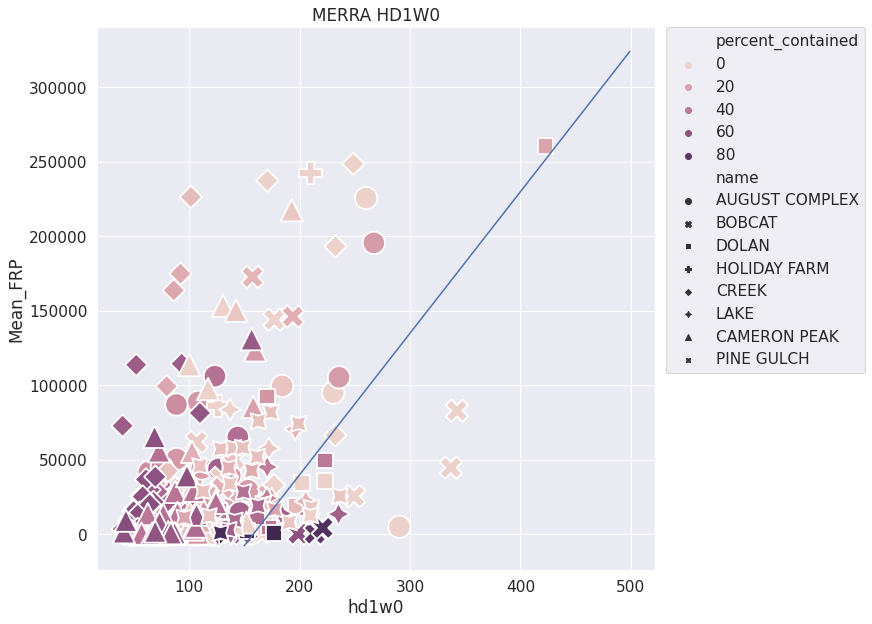

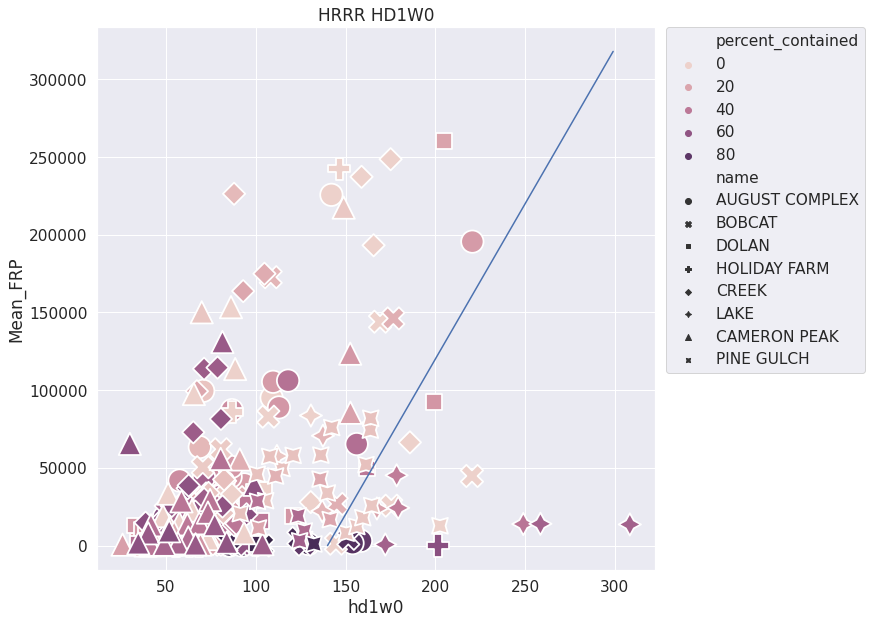

In [65]:
#identify the outliers
fig,ax=plt.subplots(figsize=(10,10))
#sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
#                hue='percent_contained',style='name',s=500,ax=ax, alpha=.3, legend=False)
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='percent_contained',style='name',s=500,ax=ax)
plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
#sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
#                hue='percent_contained',style='name',s=500,ax=ax, alpha=.3, legend=False)
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='percent_contained',style='name',s=500,ax=ax)
plt.plot(np.arange(140,300), 2000*np.arange(140,300)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

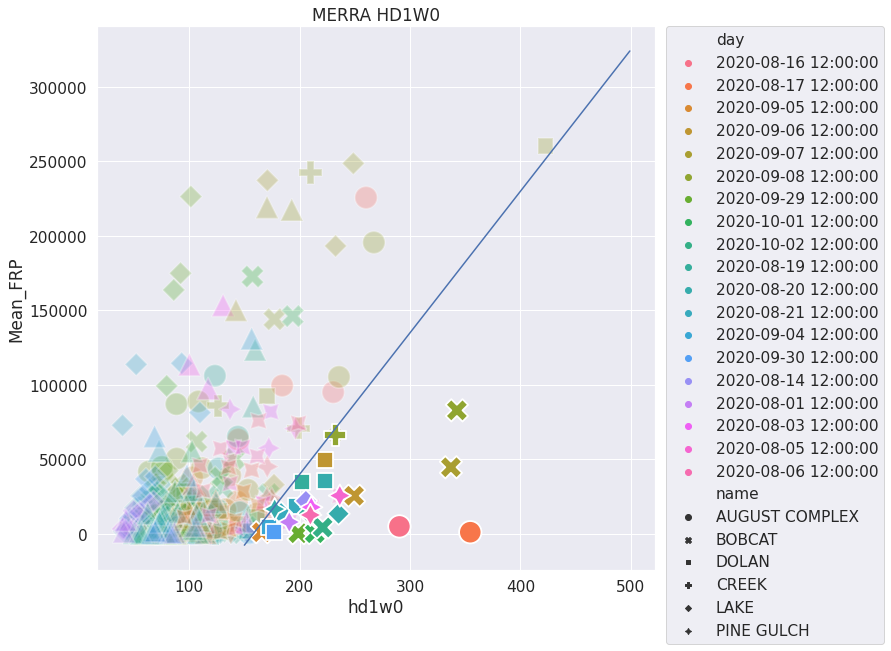

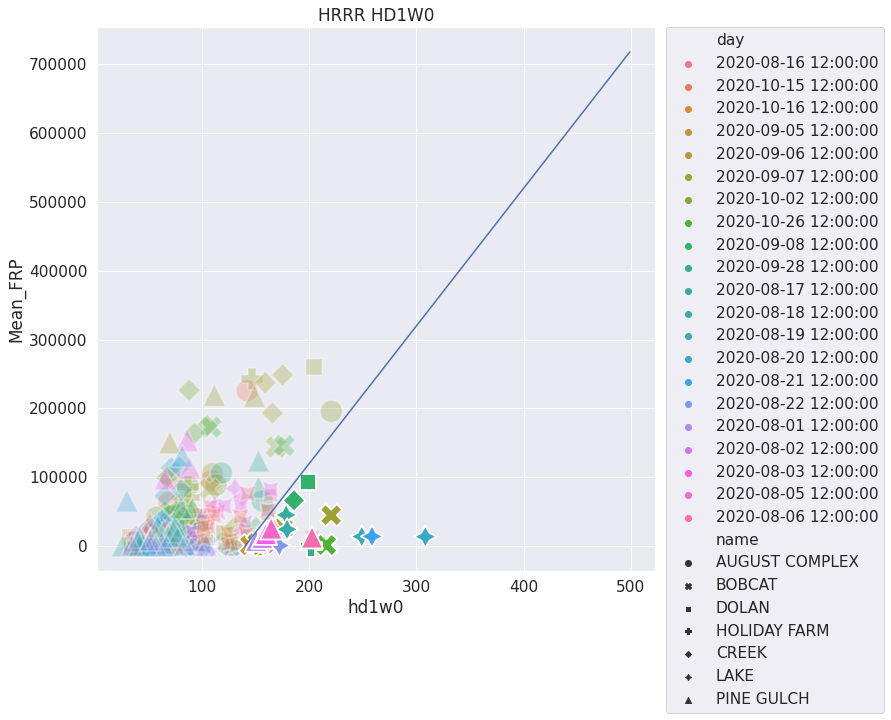

In [10]:
#when do the outliers happen?
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='day',style='name',s=500,ax=ax, alpha=.3, legend=False)
sns.scatterplot(data =df_merra_filtered, x='hd1w0',y='Mean_FRP',
                hue='day',style='name',s=500,ax=ax)
plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='day',style='name',s=500,ax=ax, alpha=.3, legend=False)
sns.scatterplot(data =df_hrrr_filtered, x='hd1w0',y='Mean_FRP',
                hue='day',style='name',s=500,ax=ax)
plt.plot(np.arange(140,500), 2000*np.arange(140,500)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

In [ ]:
#when do the outliers happen?
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='ESI Category',style='name',s=500,ax=ax, alpha=.3, legend=False, palette='vlag')
sns.scatterplot(data =df_merra_filtered[df_merra_filtered['percent_contained']<30], x='hd1w0',y='Mean_FRP',
                hue='ESI Category',style='name',s=500,ax=ax, palette='vlag')
plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='ESI Category',style='name',s=500,ax=ax, alpha=.3, legend=False, palette='vlag')
sns.scatterplot(data =df_hrrr_filtered[df_hrrr_filtered['percent_contained']<30], x='hd1w0',y='Mean_FRP',
                hue='ESI Category',style='name',s=500,ax=ax, palette='vlag')
plt.plot(np.arange(140,500), 2000*np.arange(140,500)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

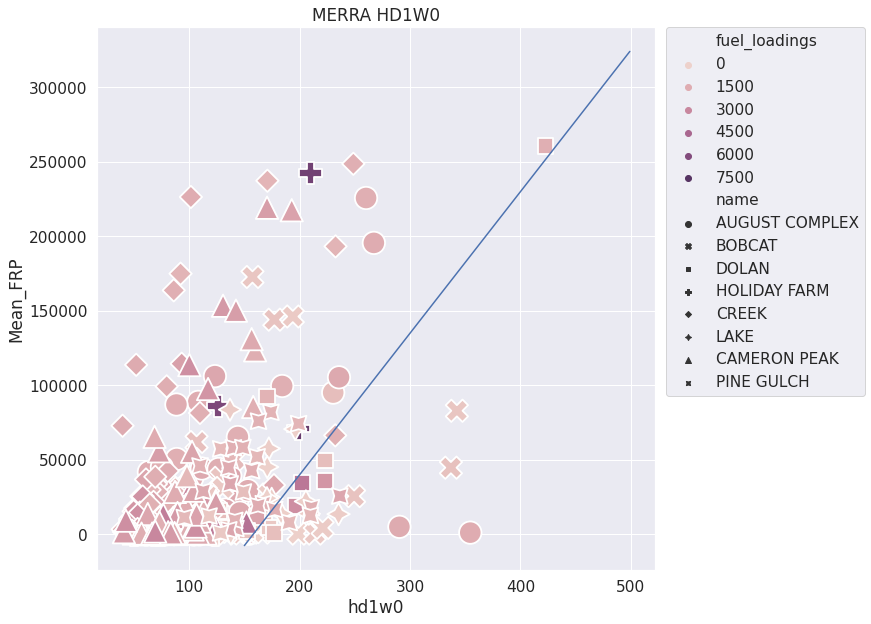

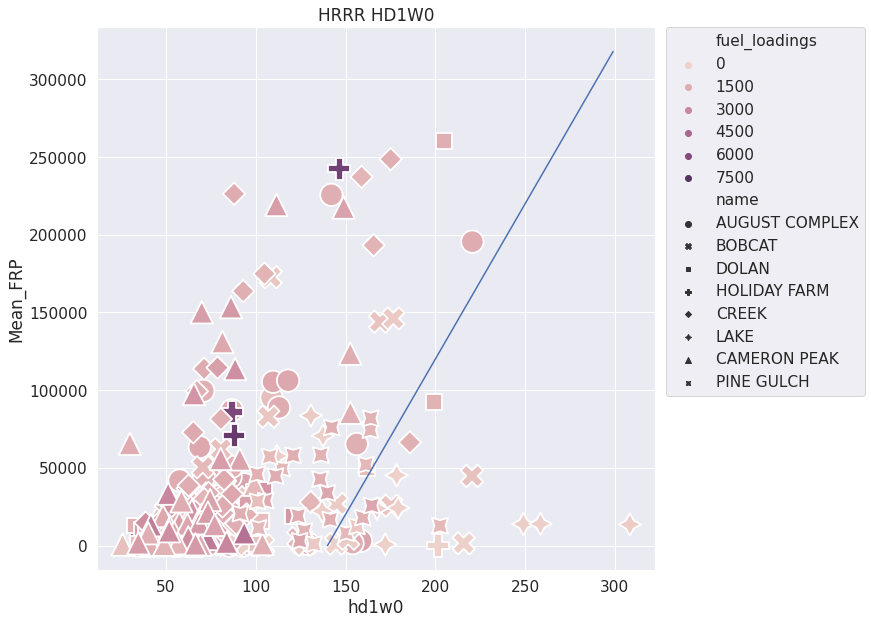

In [67]:
#fuel loading?
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='fuel_loadings',style='name',s=500,ax=ax, alpha=.3, legend=False)
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='fuel_loadings',style='name',s=500,ax=ax)
plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='fuel_loadings',style='name',s=500,ax=ax, alpha=.3, legend=False)
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='fuel_loadings',style='name',s=500,ax=ax)
plt.plot(np.arange(140,300), 2000*np.arange(140,300)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

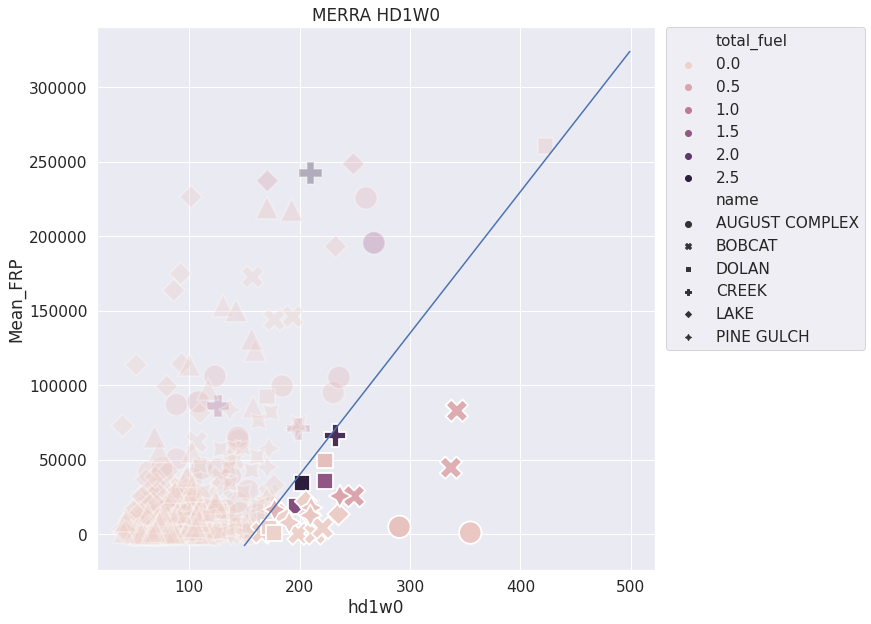

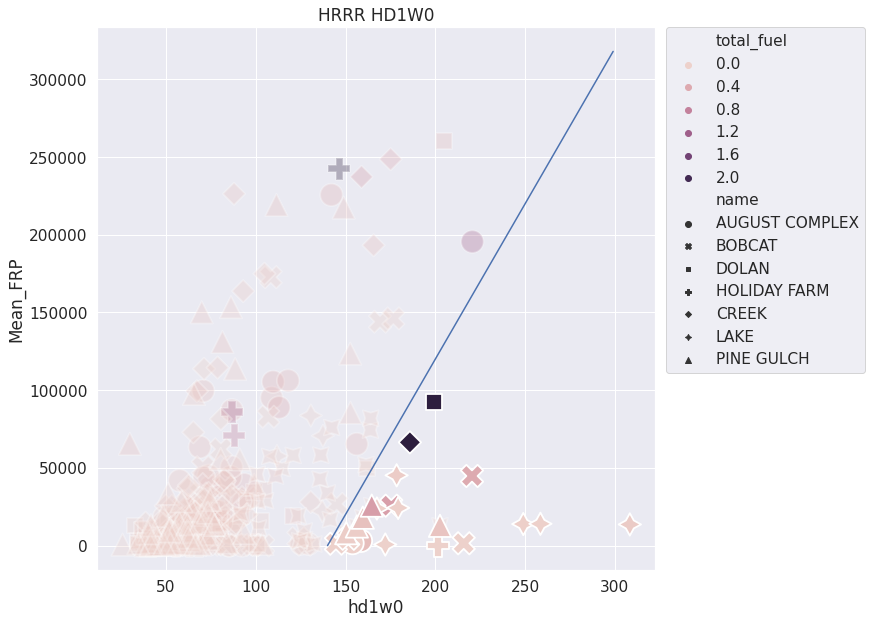

In [22]:
#fuel loading?
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='total_fuel',style='name',s=500,ax=ax, alpha=.3, legend=False)
sns.scatterplot(data =df_merra_filtered, x='hd1w0',y='Mean_FRP',
                hue='total_fuel',style='name',s=500,ax=ax)
plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='total_fuel',style='name',s=500,ax=ax, alpha=.3, legend=False)
sns.scatterplot(data =df_hrrr_filtered, x='hd1w0',y='Mean_FRP',
                hue='total_fuel',style='name',s=500,ax=ax)
plt.plot(np.arange(140,300), 2000*np.arange(140,300)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

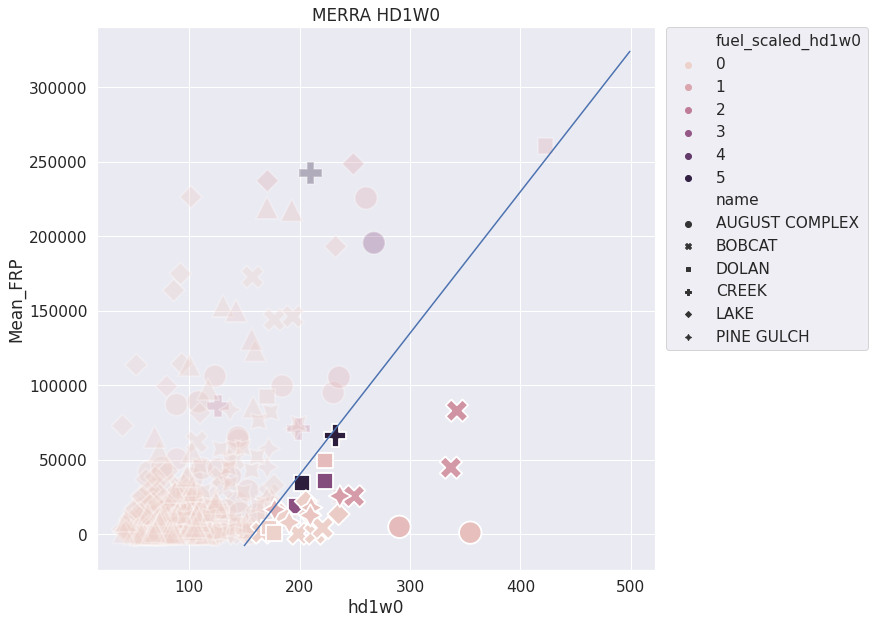

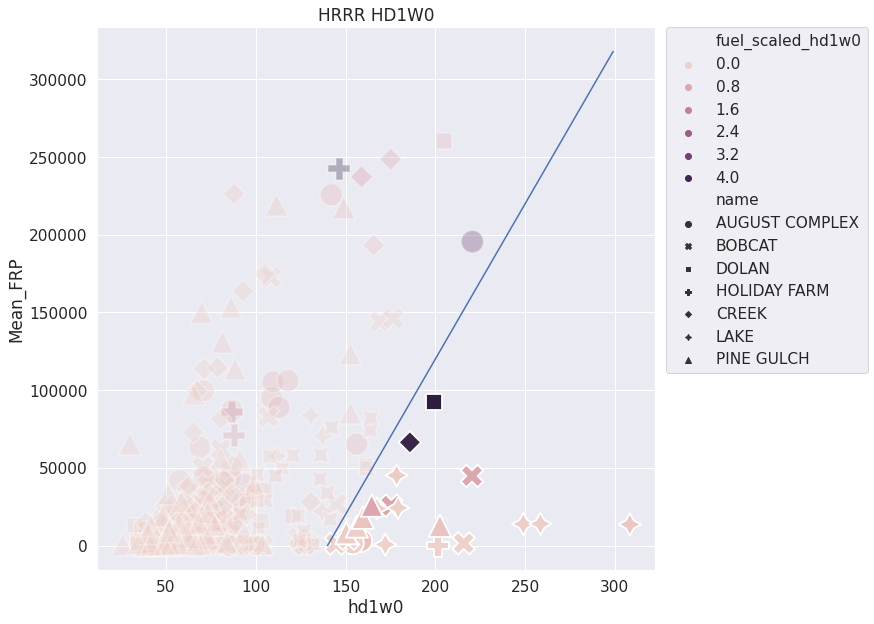

In [54]:
#fuel loading?
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='fuel_scaled_hd1w0',style='name',s=500,ax=ax, alpha=.3, legend=False)
sns.scatterplot(data =df_merra_filtered, x='hd1w0',y='Mean_FRP',
                hue='fuel_scaled_hd1w0',style='name',s=500,ax=ax)
plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='fuel_scaled_hd1w0',style='name',s=500,ax=ax, alpha=.3, legend=False)
sns.scatterplot(data =df_hrrr_filtered, x='hd1w0',y='Mean_FRP',
                hue='fuel_scaled_hd1w0',style='name',s=500,ax=ax)
plt.plot(np.arange(140,300), 2000*np.arange(140,300)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

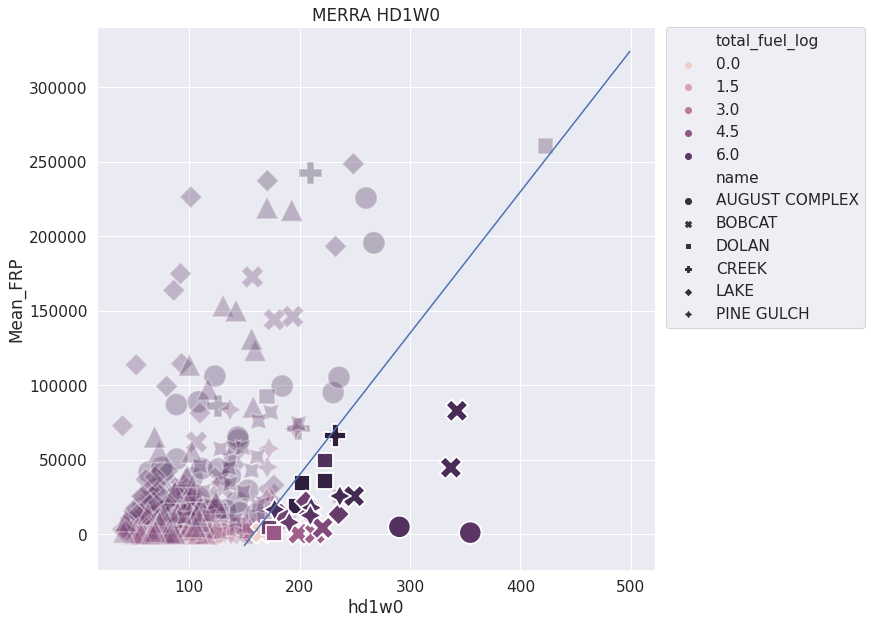

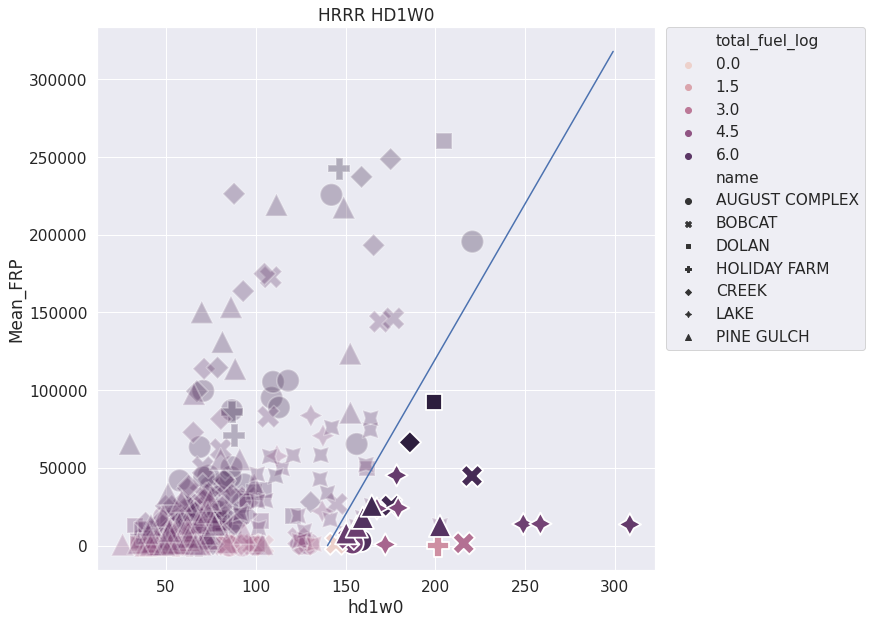

In [24]:
#fuel loading?
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='total_fuel_log',style='name',s=500,ax=ax, alpha=.3, legend=False)
sns.scatterplot(data =df_merra_filtered, x='hd1w0',y='Mean_FRP',
                hue='total_fuel_log',style='name',s=500,ax=ax)
plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='total_fuel_log',style='name',s=500,ax=ax, alpha=.3, legend=False)
sns.scatterplot(data =df_hrrr_filtered, x='hd1w0',y='Mean_FRP',
                hue='total_fuel_log',style='name',s=500,ax=ax)
plt.plot(np.arange(140,300), 2000*np.arange(140,300)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

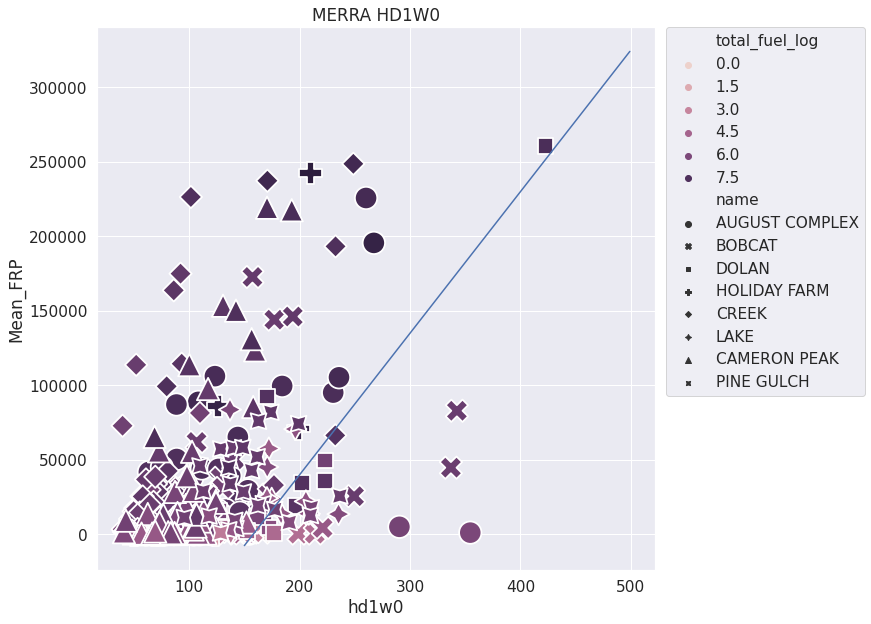

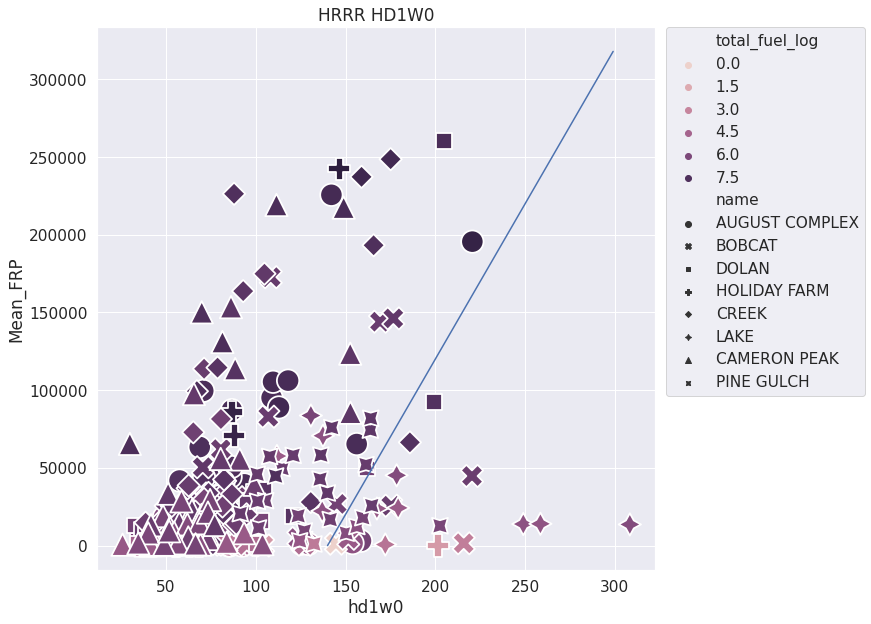

In [25]:
#fuel loading?
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='total_fuel_log',style='name',s=500,ax=ax)
plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='total_fuel_log',style='name',s=500,ax=ax)
plt.plot(np.arange(140,300), 2000*np.arange(140,300)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

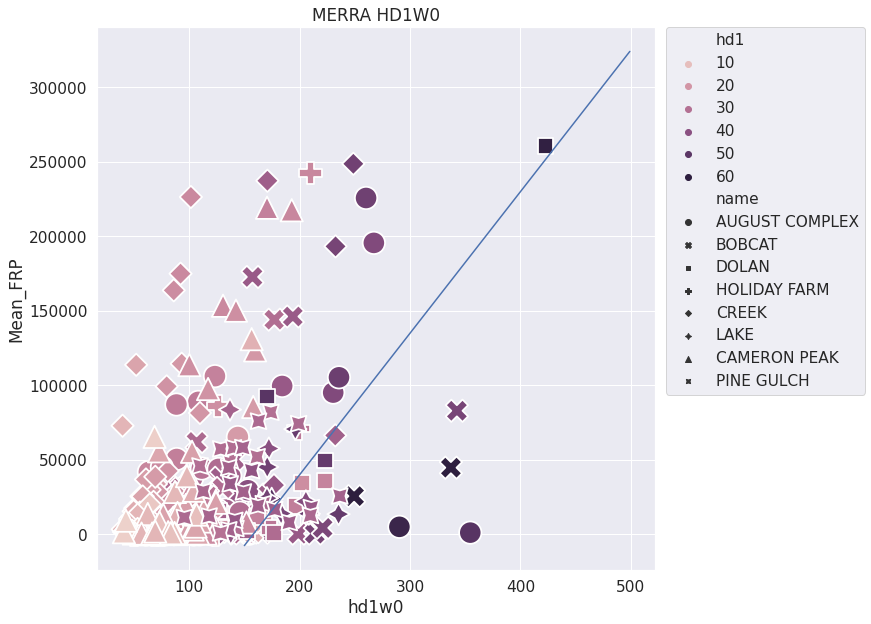

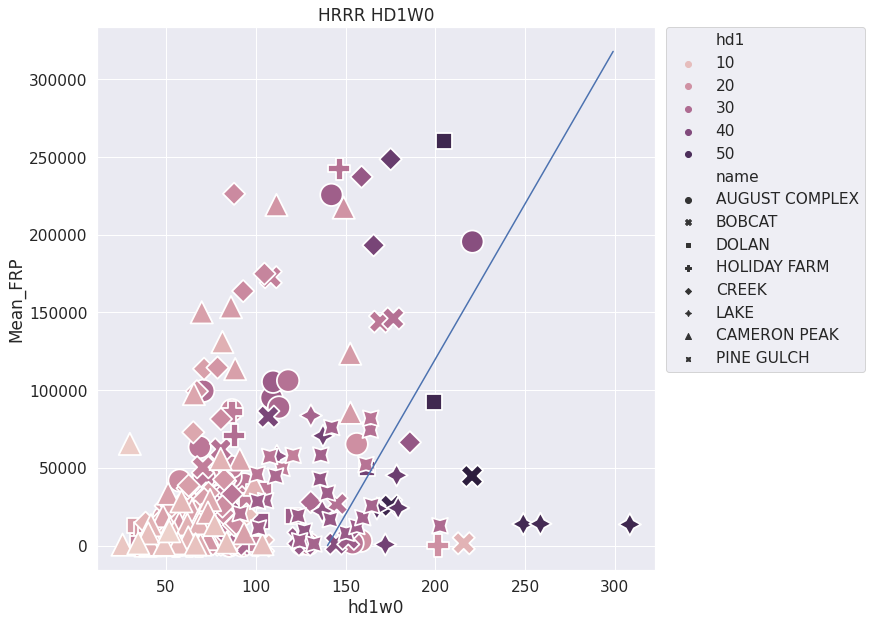

In [10]:
#HDW Components?
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='hd1',style='name',s=500,ax=ax)
plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='hd1',style='name',s=500,ax=ax)
plt.plot(np.arange(140,300), 2000*np.arange(140,300)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

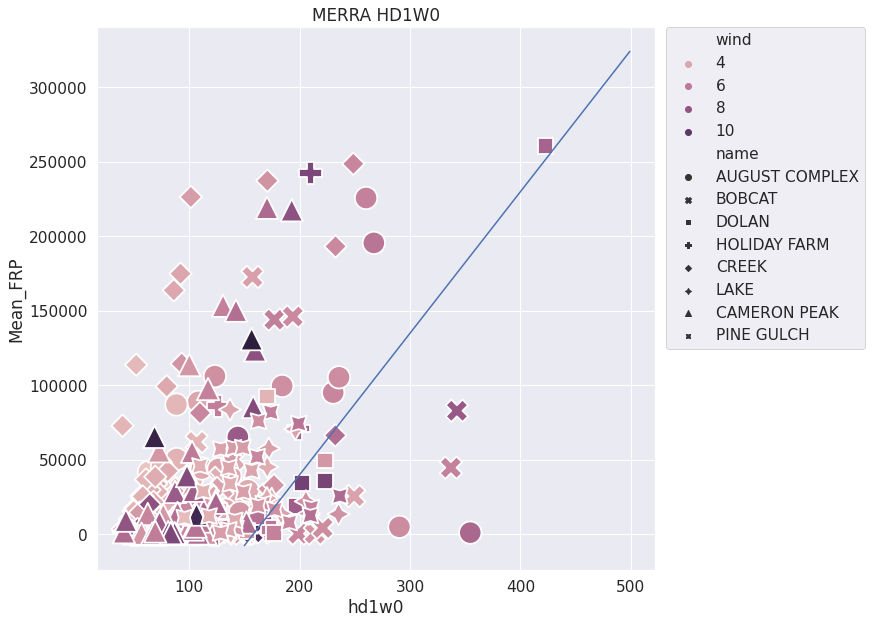

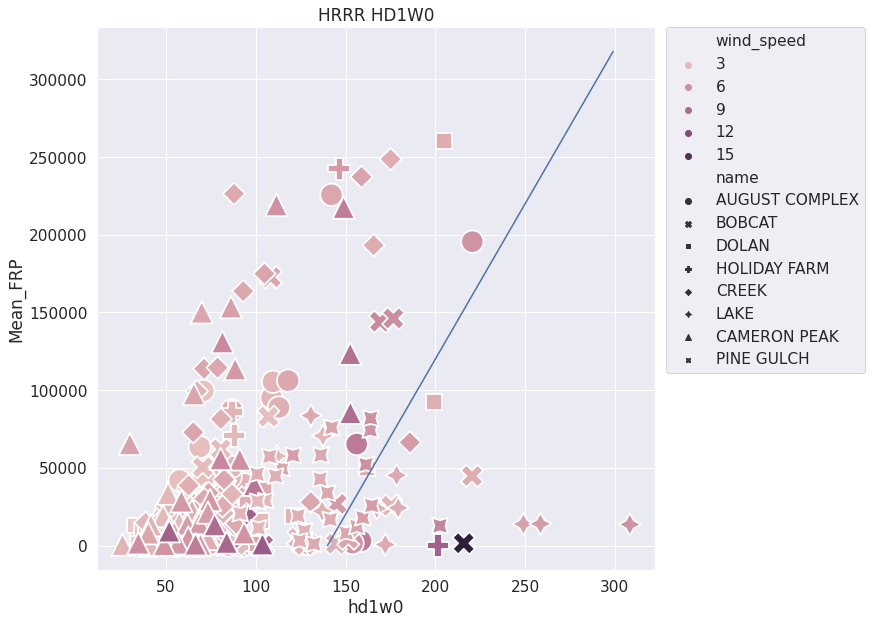

In [11]:
#HDW Components?
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='wind',style='name',s=500,ax=ax)
plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='wind_speed',style='name',s=500,ax=ax)
plt.plot(np.arange(140,300), 2000*np.arange(140,300)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

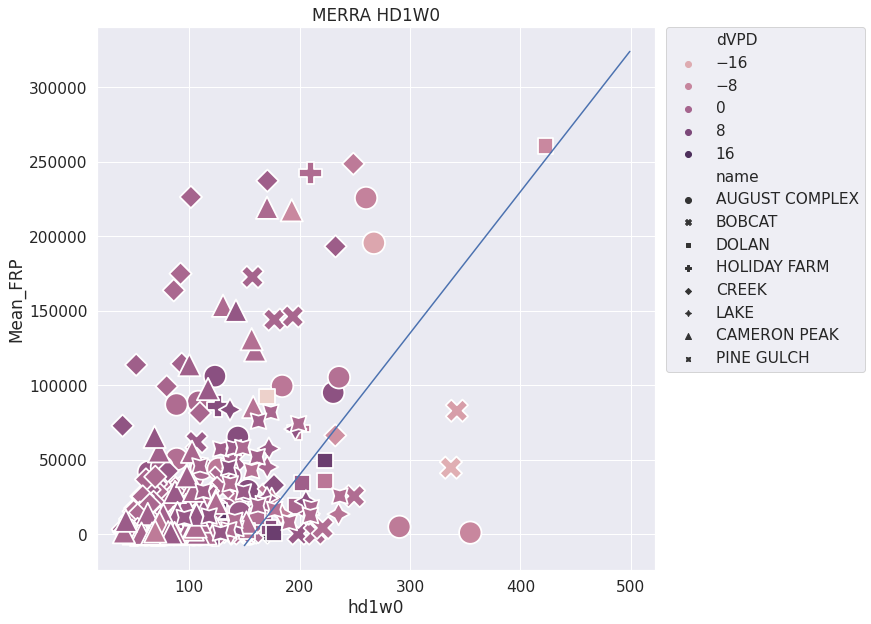

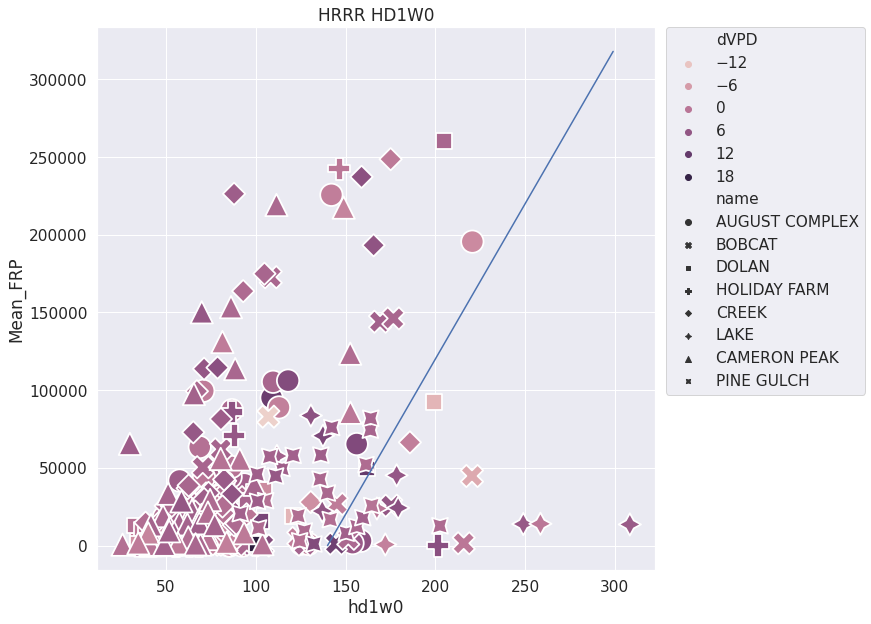

In [25]:
#HDW Components?
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='dVPD',style='name',s=500,ax=ax)
plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='dVPD',style='name',s=500,ax=ax)
plt.plot(np.arange(140,300), 2000*np.arange(140,300)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

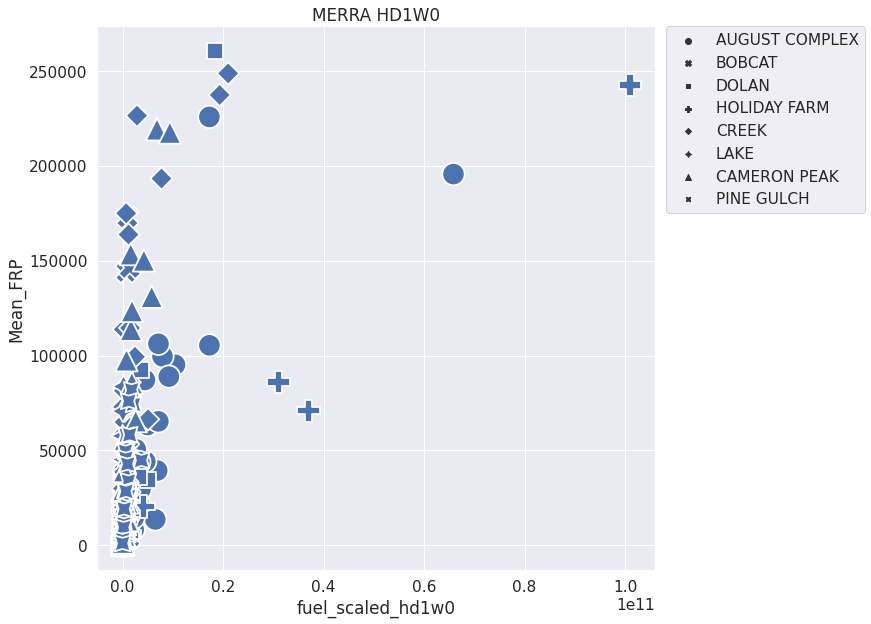

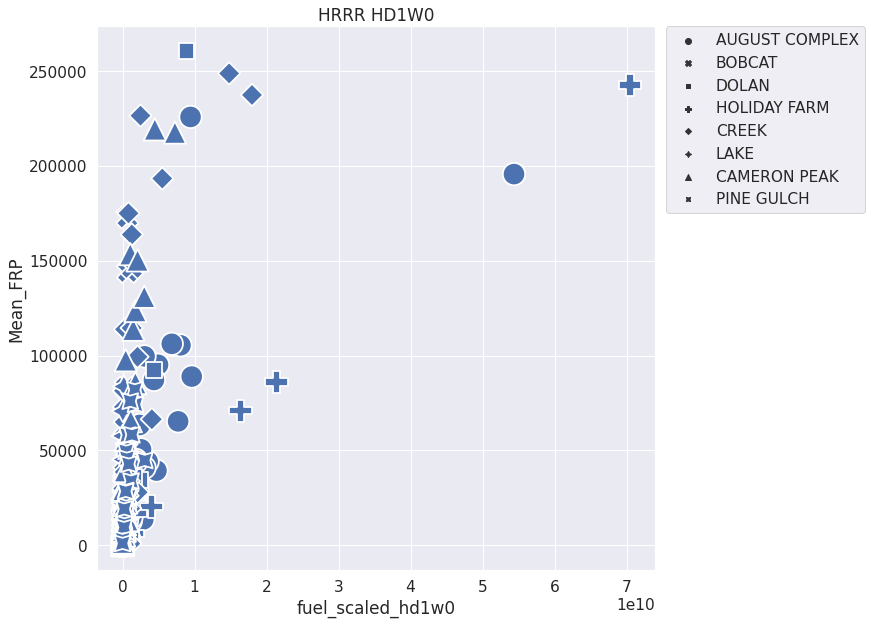

In [64]:
#fuel loading?
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra, x='fuel_scaled_hd1w0',y='Mean_FRP',
                hue=None,style='name',s=500,ax=ax)
#plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr, x='fuel_scaled_hd1w0',y='Mean_FRP',
                hue=None,style='name',s=500,ax=ax)
#plt.plot(np.arange(140,300), 2000*np.arange(140,300)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

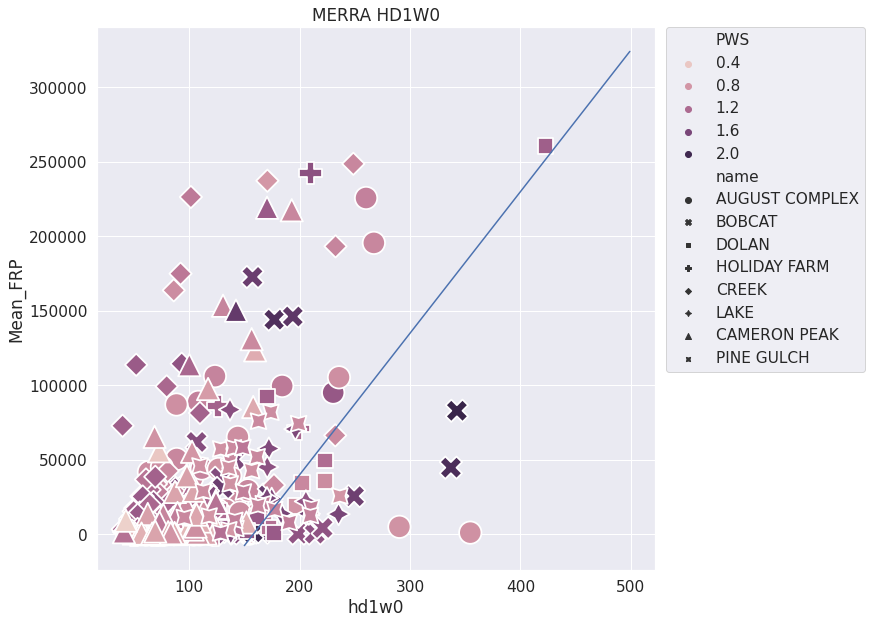

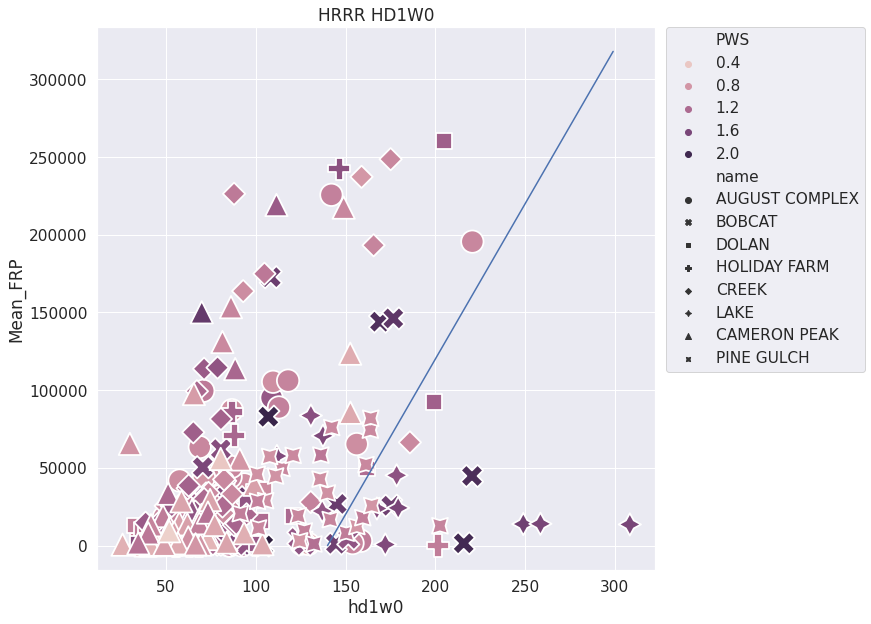

In [125]:
#when do the outliers happen?
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='PWS',style='name',s=500,ax=ax)
plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='PWS',style='name',s=500,ax=ax)
plt.plot(np.arange(140,300), 2000*np.arange(140,300)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

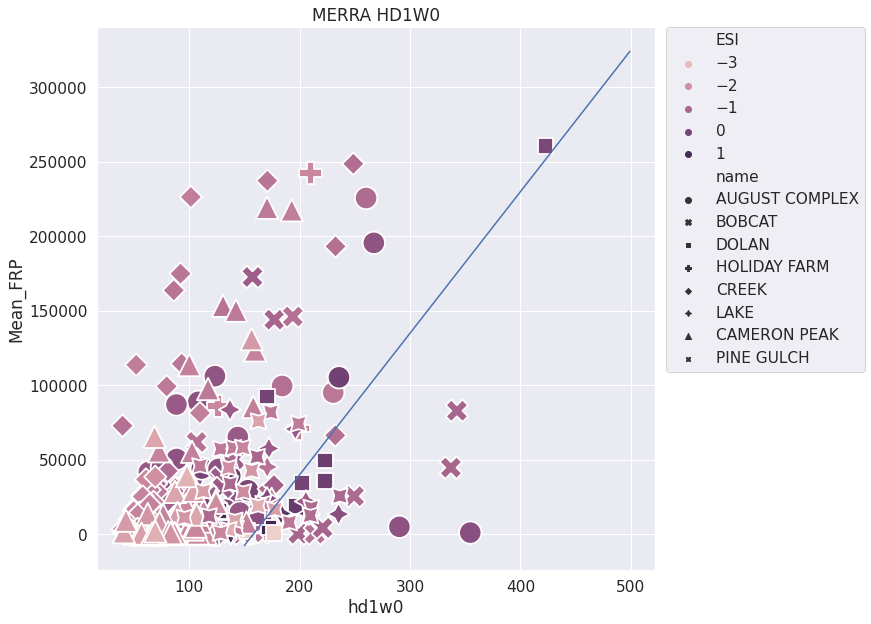

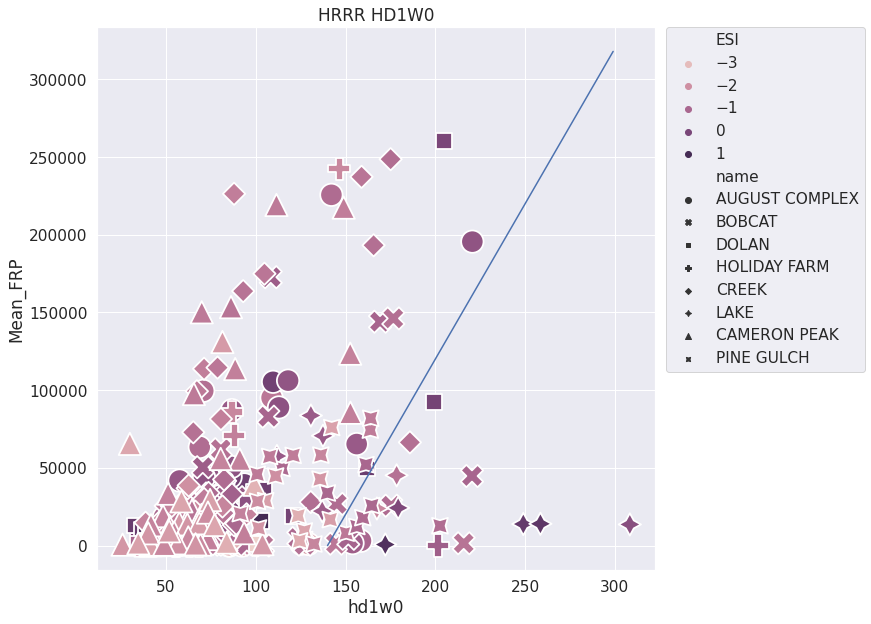

In [126]:
#when do the outliers happen?
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='ESI',style='name',s=500,ax=ax)
plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='ESI',style='name',s=500,ax=ax)
plt.plot(np.arange(140,300), 2000*np.arange(140,300)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

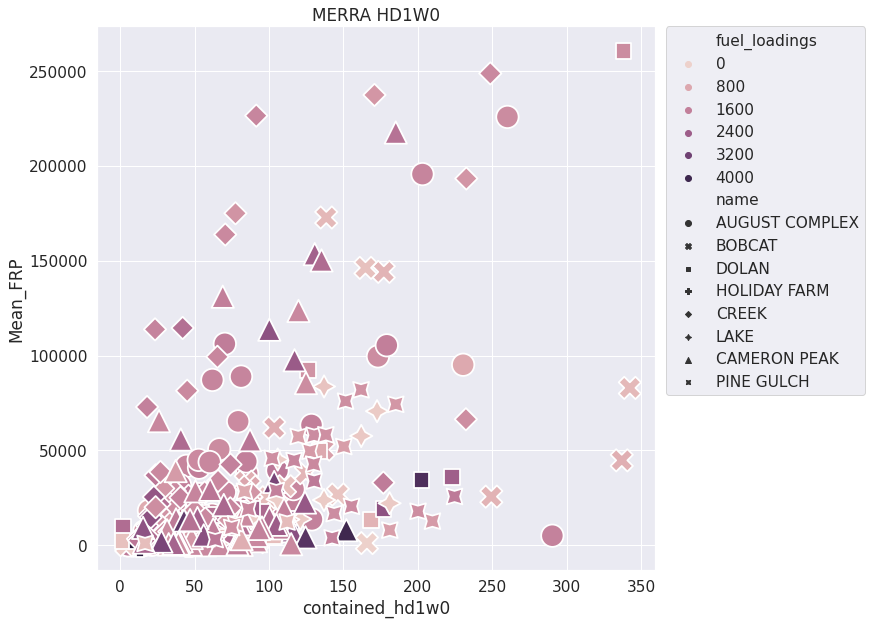

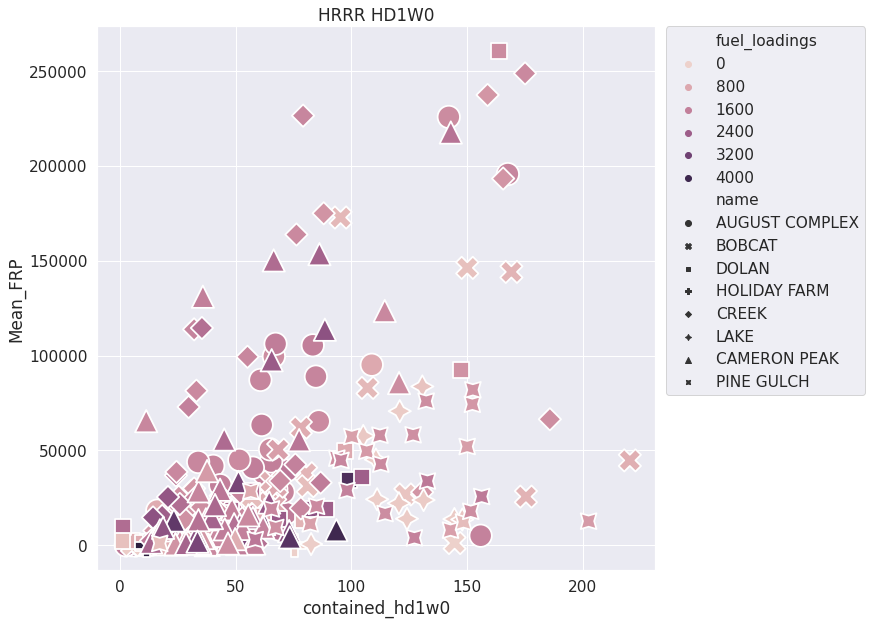

In [146]:
#when do the outliers happen?
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra[df_merra['fuel_loadings']<6000], x='contained_hd1w0',y='Mean_FRP',
                hue='fuel_loadings',style='name',s=500,ax=ax)
#plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr[df_hrrr['fuel_loadings']<6000], x='contained_hd1w0',y='Mean_FRP',
                hue='fuel_loadings',style='name',s=500,ax=ax)
#plt.plot(np.arange(140,300), 2000*np.arange(140,300)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

## Shade by fuel Type

In [ ]:
#forest
fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_merra, x='hd1w0',y='Mean_FRP',
                hue='Dominant Simple Fuel Category',style='name',size='percent_contained',sizes=(100,600),
                ax=ax, alpha=.3, legend=False)
sns.scatterplot(data =df_merra_filtered, x='hd1w0',y='Mean_FRP',size='percent_contained',sizes=(100,600),
                hue='Dominant Simple Fuel Category',style='name',s=500,ax=ax)
plt.plot(np.arange(150,500), 950*np.arange(150,500)-150000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('MERRA HD1W0')
plt.show()

fig,ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data =df_hrrr, x='hd1w0',y='Mean_FRP',
                hue='Dominant Simple Fuel Category',style='name',size='percent_contained',sizes=(100,600),
                ax=ax, alpha=.3, legend=False)
sns.scatterplot(data =df_hrrr_filtered, x='hd1w0',y='Mean_FRP',size='percent_contained',sizes=(100,600),
                hue='Dominant Simple Fuel Category',style='name',s=500,ax=ax)
plt.plot(np.arange(140,300), 2000*np.arange(140,300)-280000)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
plt.title('HRRR HD1W0')
plt.show()

In [ ]:
plot_correlations(df_hrrr, 'HRRR Met Pearson','pearson')
plot_correlations(df_merra, 'MERRA Met Pearson','pearson')

#plot_correlations(df_hrrr_filtered, 'HRRR Met Filtered spearman','spearman')
#plot_correlations(df_merra_filtered, 'MERRA Met Filtered spearman','spearman')

In [ ]:


#containment
scatter_plot_two(df_hrrr, df_hrrr_filtered,'hd1w0','Mean_FRP','percent_contained', 
                 'name', 'percent_contained', (100,600),'HRRR HD1W0 Shaded by % Contained and Fire Name')
scatter_plot_two(df_merra, df_merra_filtered,'hd1w0','Mean_FRP','percent_contained', 
                 'name', 'percent_contained', (100,600),'MERRA HD1W0 Shaded by % Contained and Fire Name')

"""
#personnel
scatter_plot_two(df_hrrr, df_hrrr_filtered,'hd1w0','Mean_FRP','personnel', 
                 'name', 'personnel', (100,600),'HRRR HD1W0 Shaded by # Personnel and Fire Name')
scatter_plot_two(df_merra, df_merra_filtered,'hd1w0','Mean_FRP','personnel', 
                 'name', 'personnel', (100,600),'MERRA HD1W0 Shaded by # Personnel and Fire Name')

#PWS
scatter_plot_two(df_hrrr, df_hrrr_filtered,'hd1w0','Mean_FRP','PWS', 
                 'name', 'PWS', (100,600),'HRRR HD1W0 Shaded by PWS and Fire Name')
scatter_plot_two(df_merra, df_merra_filtered,'hd1w0','Mean_FRP','PWS', 
                 'name', 'PWS', (100,600),'MERRA HD1W0 Shaded by PWS and Fire Name')
                 """

In [ ]:
plot_correlations(df_hrrr[df_hrrr['percent_contained']<40], 'HRRR Met Filtered Pearson <30% Contained','pearson')
plot_correlations(df_hrrr[df_hrrr['percent_contained']>40], 'HRRR Met Filtered Pearson >30% Contained','pearson')

plot_correlations(df_hrrr, 'HRRR Met','pearson')


In [ ]:
scatter_plot(df_hrrr[df_hrrr['Dominant Simple Fuel Category']=='grassland'],'hd1w0','Mean_FRP','Dominant Simple Fuel Category',
             'name', None, (600,600),'HRRR Met')


## Line plots

In [7]:
#plots two lines, on one or on the same axis
# IN: datax, x axis vector (time)
# IN: datay, 2*n vector of the data
# IN: linelabels, string vector of the labels of each line, to go in the legend
# IN: axis labels, labels of the axis
# IN: title, string for title of figire
# IN: twoaxis, if 1 plot data on two separate axes, else plot on the same axis
# OUT: a graph
def plot_twoline(datax, datay, title, linelabels, axislabels, twoaxis,xtickspacing):
    fig, ax = plt.subplots(figsize=(20,6)) #set up the figure
    
    if twoaxis==1:
        ax.plot(datax, datay[0,:], 'ro-') # plot the first line
        ax.set_ylabel(axislabels[0], fontsize=24, color='red') 
        ax2=ax.twinx()
        ax2.plot(datax, datay[1,:], 'bo-') #plot the second line
        ax2.set_ylabel(axislabels[1], fontsize=24, color='blue')
        
    else:
        ax.plot(datax, datay[0,:], 'ro-') # plot the first line
        ax.plot(datax, datay[1,:], 'bo-') # plot the second line
        ax.set_ylabel(axislabels, fontsize=24) 
    #print(np.arange(1,len(datax.values),6))
    plt.xticks(np.arange(1,len(datax.values),xtickspacing))    
    plt.legend(linelabels,fontsize=24)
    plt.title(title,fontsize=24)
    plt.grid()
    plt.show()

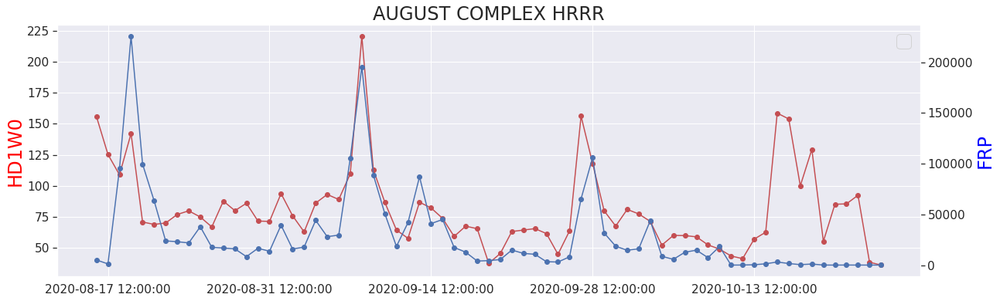

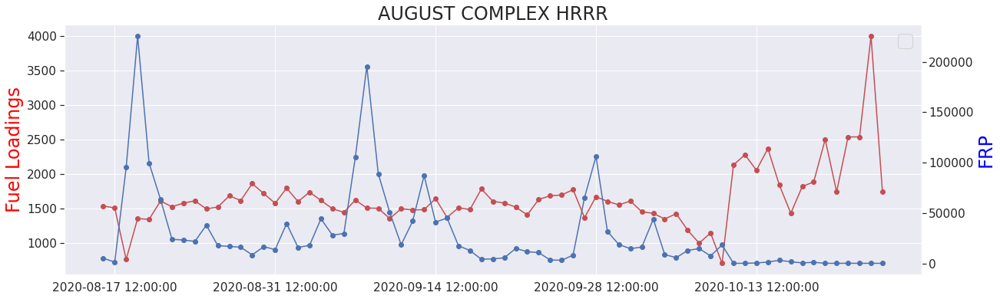

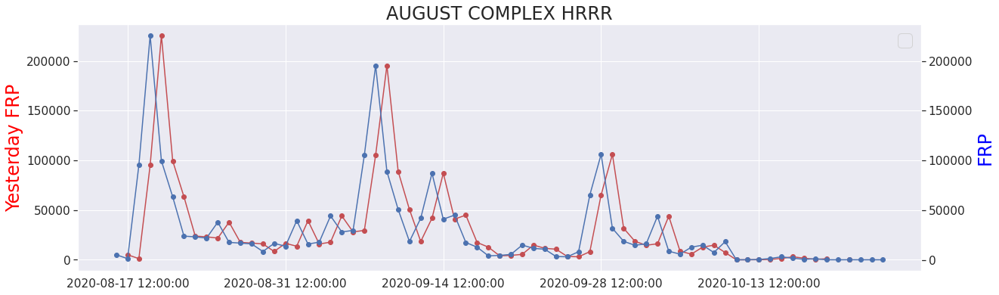

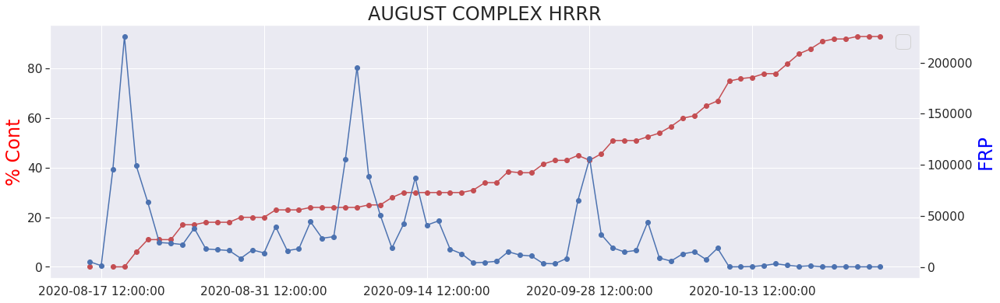

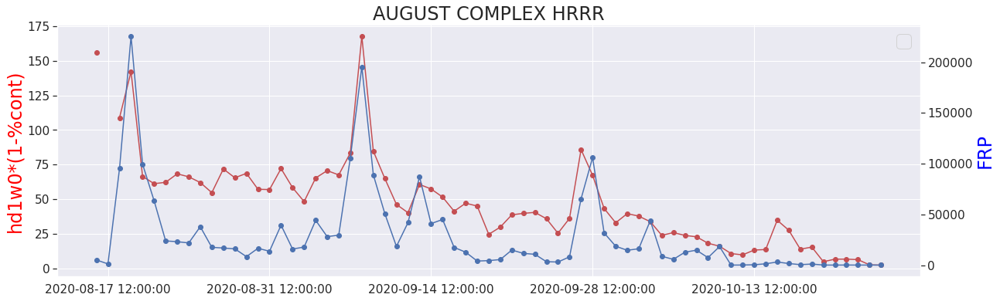

...

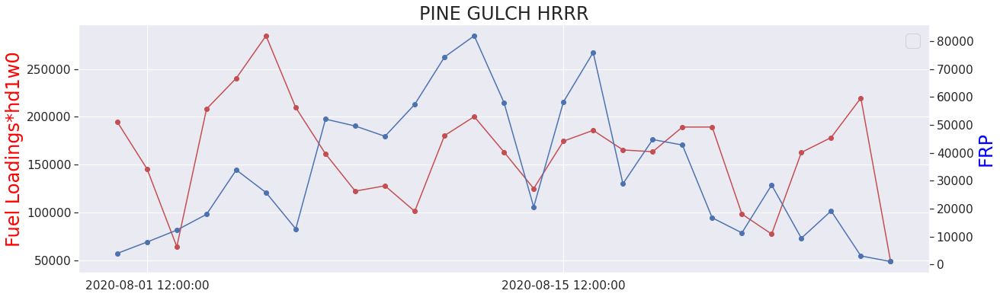

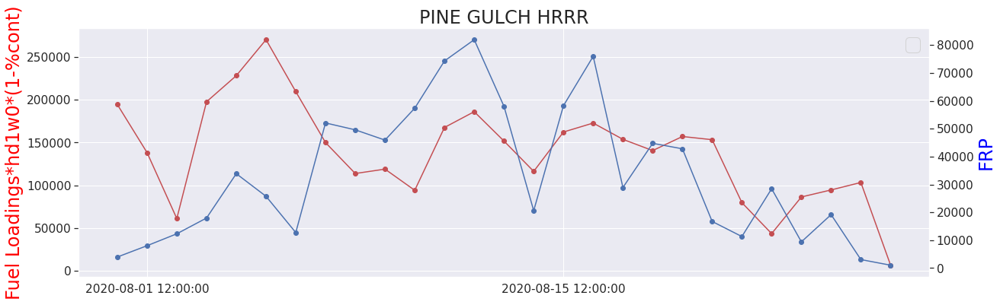

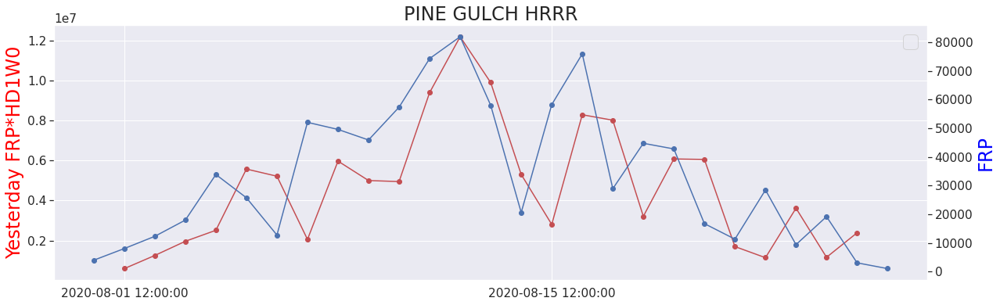

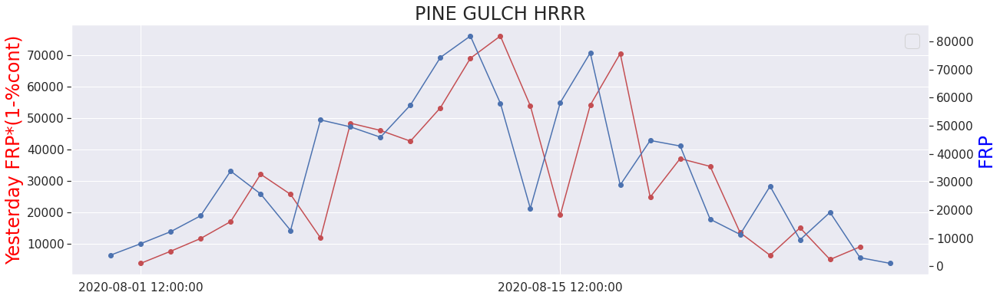

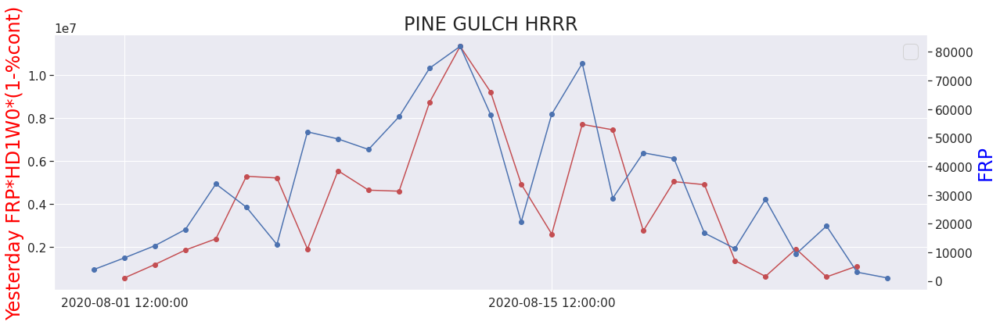

In [24]:
fire_incidents = ['AUGUST COMPLEX', 'BOBCAT', 'DOLAN', 'HOLIDAY FARM','CREEK', 'LAKE', 'CAMERON PEAK', 'PINE GULCH']
#fire_incidents=['AUGUST COMPLEX']
for ii in range(len(fire_incidents)):
    df_plot_hrrr = df_hrrr[df_hrrr['name'].str.contains(fire_incidents[ii])]
    df_plot_merra = df_merra[df_merra['name'].str.contains(fire_incidents[ii])]

    plot_twoline(df_plot_hrrr['day'], np.stack([df_plot_hrrr['hd1w0'], df_plot_hrrr['Mean_FRP']]), fire_incidents[ii]+' HRRR',\
             [], ['HD1W0','FRP'], 1, 14)
    plot_twoline(df_plot_hrrr['day'], np.stack([df_plot_hrrr['fuel_loadings'], df_plot_hrrr['Mean_FRP']]), fire_incidents[ii]+' HRRR',\
             [], ['Fuel Loadings','FRP'], 1, 14)
    plot_twoline(df_plot_hrrr['day'], np.stack([df_plot_hrrr['Yesterday FRP'], df_plot_hrrr['Mean_FRP']]), fire_incidents[ii]+' HRRR',\
             [], ['Yesterday FRP','FRP'], 1, 14)
    plot_twoline(df_plot_hrrr['day'], np.stack([df_plot_hrrr['percent_contained'], df_plot_hrrr['Mean_FRP']]), fire_incidents[ii]+' HRRR',\
             [], ['% Cont','FRP'], 1, 14)
    
    plot_twoline(df_plot_hrrr['day'], np.stack([df_plot_hrrr['contained_hd1w0'], df_plot_hrrr['Mean_FRP']]), fire_incidents[ii]+' HRRR',\
             [], ['hd1w0*(1-%cont)','FRP'], 1, 14)
    plot_twoline(df_plot_hrrr['day'], np.stack([df_plot_hrrr['fuel_scaled_hd1w0'], df_plot_hrrr['Mean_FRP']]), fire_incidents[ii]+' HRRR',\
             [], ['Fuel Loadings*hd1w0','FRP'], 1, 14)
    plot_twoline(df_plot_hrrr['day'], np.stack([df_plot_hrrr['contained_fuel_scaled_hd1w0'], df_plot_hrrr['Mean_FRP']]), fire_incidents[ii]+' HRRR',\
             [], ['Fuel Loadings*hd1w0*(1-%cont)','FRP'], 1, 14)
    
    plot_twoline(df_plot_hrrr['day'], np.stack([df_plot_hrrr['persistence_scaled_hd1w0'], df_plot_hrrr['Mean_FRP']]), fire_incidents[ii]+' HRRR',\
             [], ['Yesterday FRP*HD1W0','FRP'], 1, 14)
    plot_twoline(df_plot_hrrr['day'], np.stack([df_plot_hrrr['contained_persistence'], df_plot_hrrr['Mean_FRP']]), fire_incidents[ii]+' HRRR',\
             [], ['Yesterday FRP*(1-%cont)','FRP'], 1, 14)
    plot_twoline(df_plot_hrrr['day'], np.stack([df_plot_hrrr['contained_persistence_scaled_hd1w0'], df_plot_hrrr['Mean_FRP']]), fire_incidents[ii]+' HRRR',\
             [], ['Yesterday FRP*HD1W0*(1-%cont)','FRP'], 1, 14)
    
    

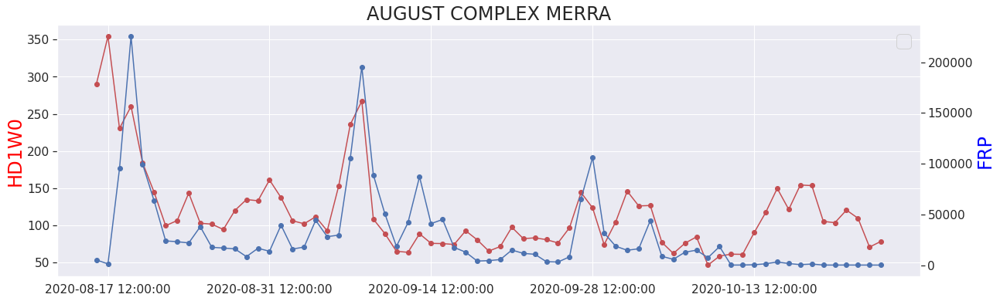

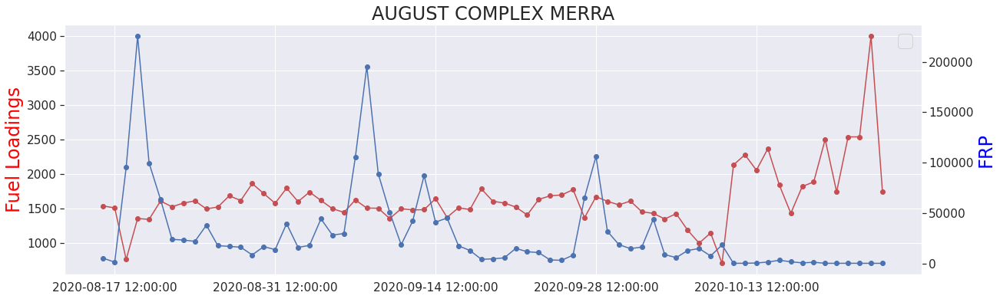

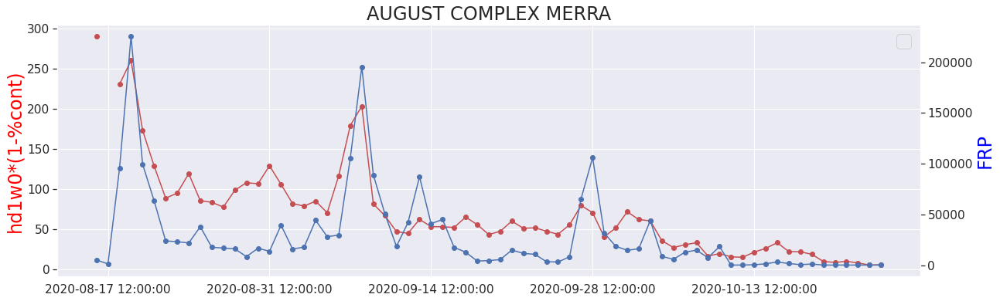

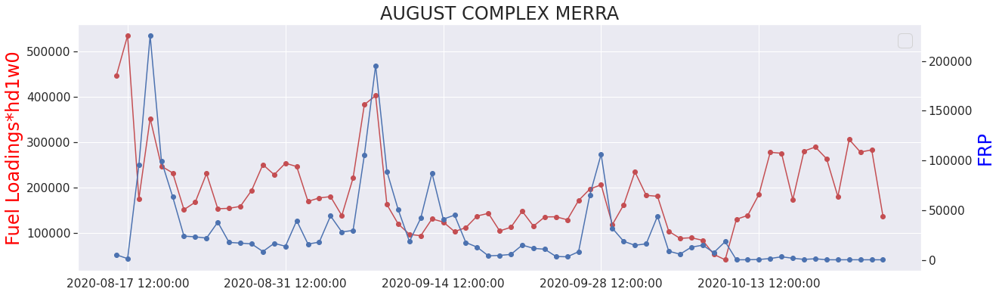

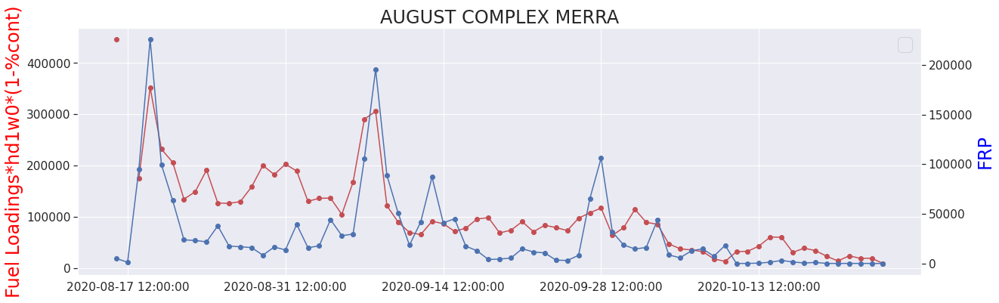

...

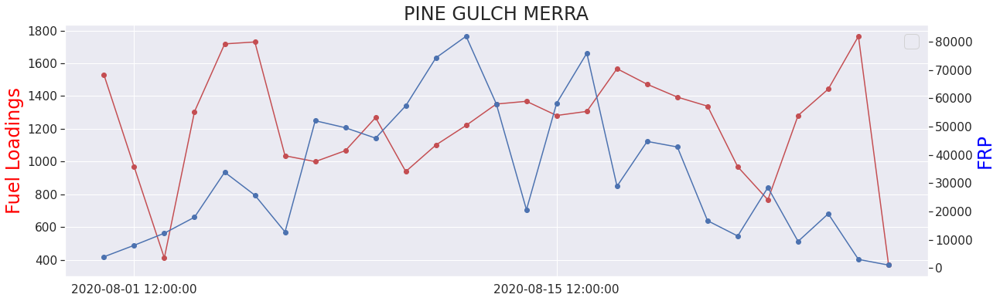

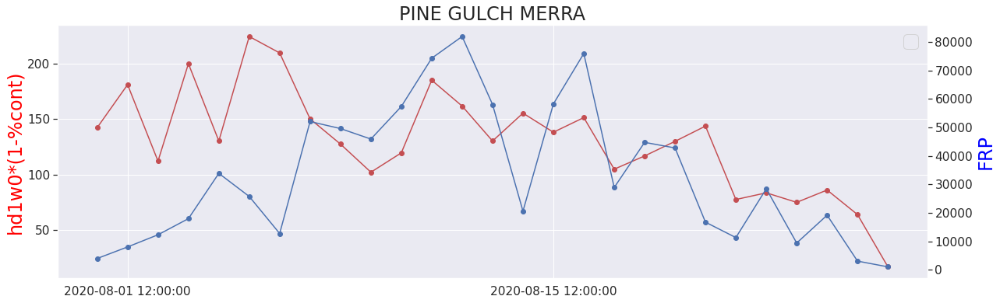

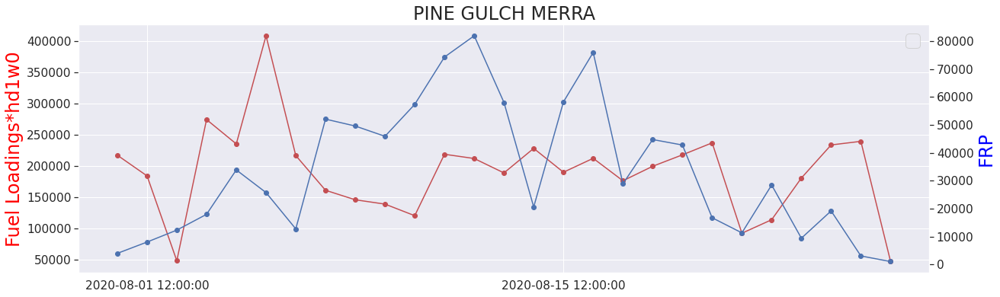

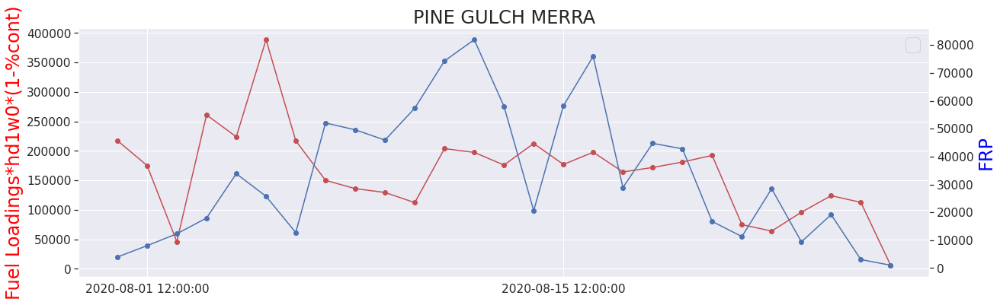

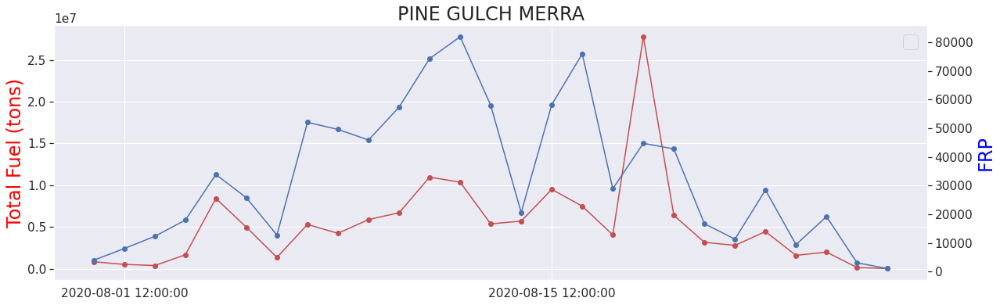

In [74]:
fire_incidents = ['AUGUST COMPLEX', 'BOBCAT', 'DOLAN', 'HOLIDAY FARM','CREEK', 'LAKE', 'CAMERON PEAK', 'PINE GULCH']
for ii in range(len(fire_incidents)):
    df_plot_hrrr = df_hrrr[df_hrrr['name'].str.contains(fire_incidents[ii])]
    df_plot_merra = df_merra[df_merra['name'].str.contains(fire_incidents[ii])]

    plot_twoline(df_plot_merra['day'], np.stack([df_plot_merra['hd1w0'], df_plot_merra['Mean_FRP']]), fire_incidents[ii]+' MERRA',\
             [], ['HD1W0','FRP'], 1, 14)
    plot_twoline(df_plot_merra['day'], np.stack([df_plot_merra['fuel_loadings'], df_plot_merra['Mean_FRP']]), fire_incidents[ii]+' MERRA',\
             [], ['Fuel Loadings','FRP'], 1, 14)
    plot_twoline(df_plot_merra['day'], np.stack([df_plot_merra['contained_hd1w0'], df_plot_merra['Mean_FRP']]), fire_incidents[ii]+' MERRA',\
             [], ['hd1w0*(1-%cont)','FRP'], 1, 14)
    plot_twoline(df_plot_merra['day'], np.stack([df_plot_merra['fuel_scaled_hd1w0'], df_plot_merra['Mean_FRP']]), fire_incidents[ii]+' MERRA',\
             [], ['Fuel Loadings*hd1w0','FRP'], 1, 14)
    plot_twoline(df_plot_merra['day'], np.stack([df_plot_merra['contained_fuel_scaled_hd1w0'], df_plot_merra['Mean_FRP']]), fire_incidents[ii]+' MERRA',\
             [], ['Fuel Loadings*hd1w0*(1-%cont)','FRP'], 1, 14)
    plot_twoline(df_plot_merra['day'], np.stack([df_plot_merra['total_fuel'], df_plot_merra['Mean_FRP']]), fire_incidents[ii]+' MERRA',\
             [], ['Total Fuel (tons)','FRP'], 1, 14)
    

## Correlation Plots

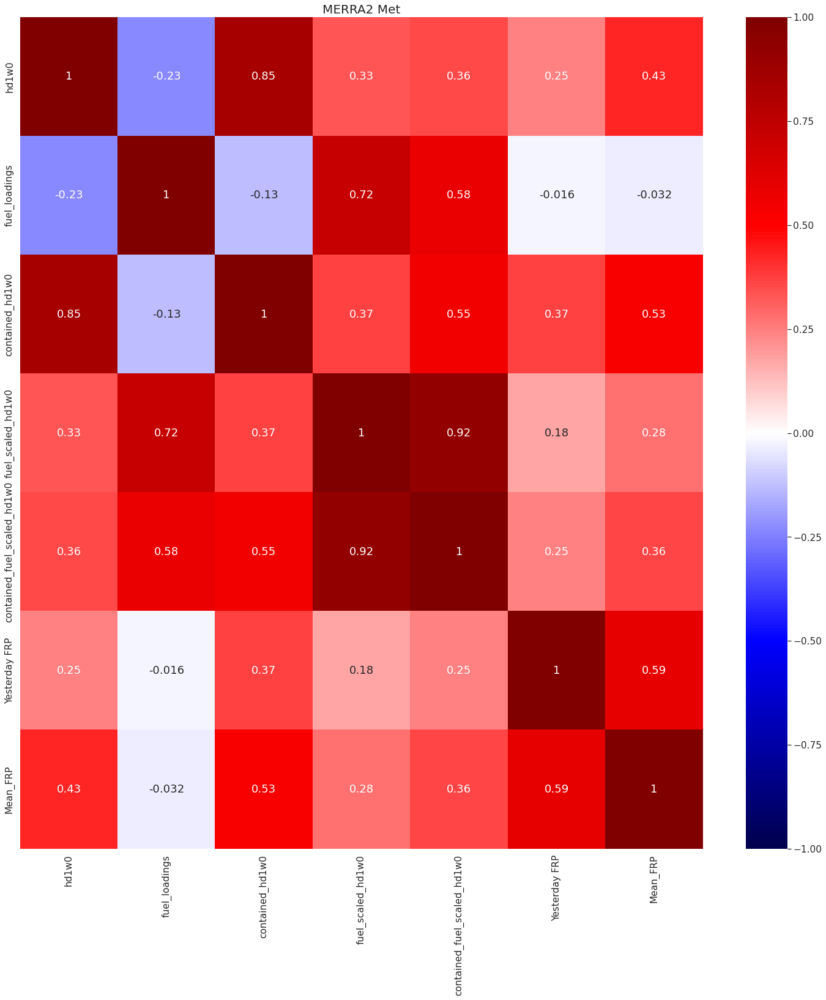

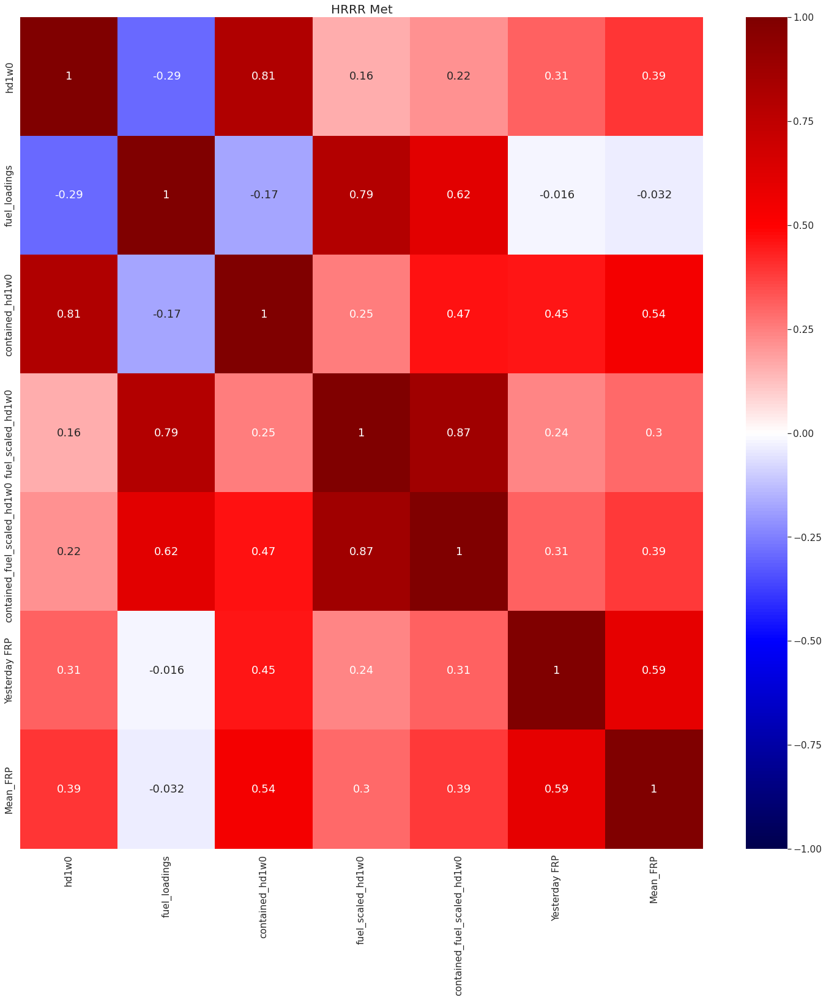

In [79]:
#for the October 24h Research Update
plot_correlations(df_merra[['hd1w0','fuel_loadings','contained_hd1w0','fuel_scaled_hd1w0','contained_fuel_scaled_hd1w0','Yesterday FRP','Mean_FRP']], 
                  'MERRA2 Met','pearson')
plot_correlations(df_hrrr[['hd1w0','fuel_loadings','contained_hd1w0','fuel_scaled_hd1w0','contained_fuel_scaled_hd1w0','Yesterday FRP','Mean_FRP']], 
                  'HRRR Met','pearson')

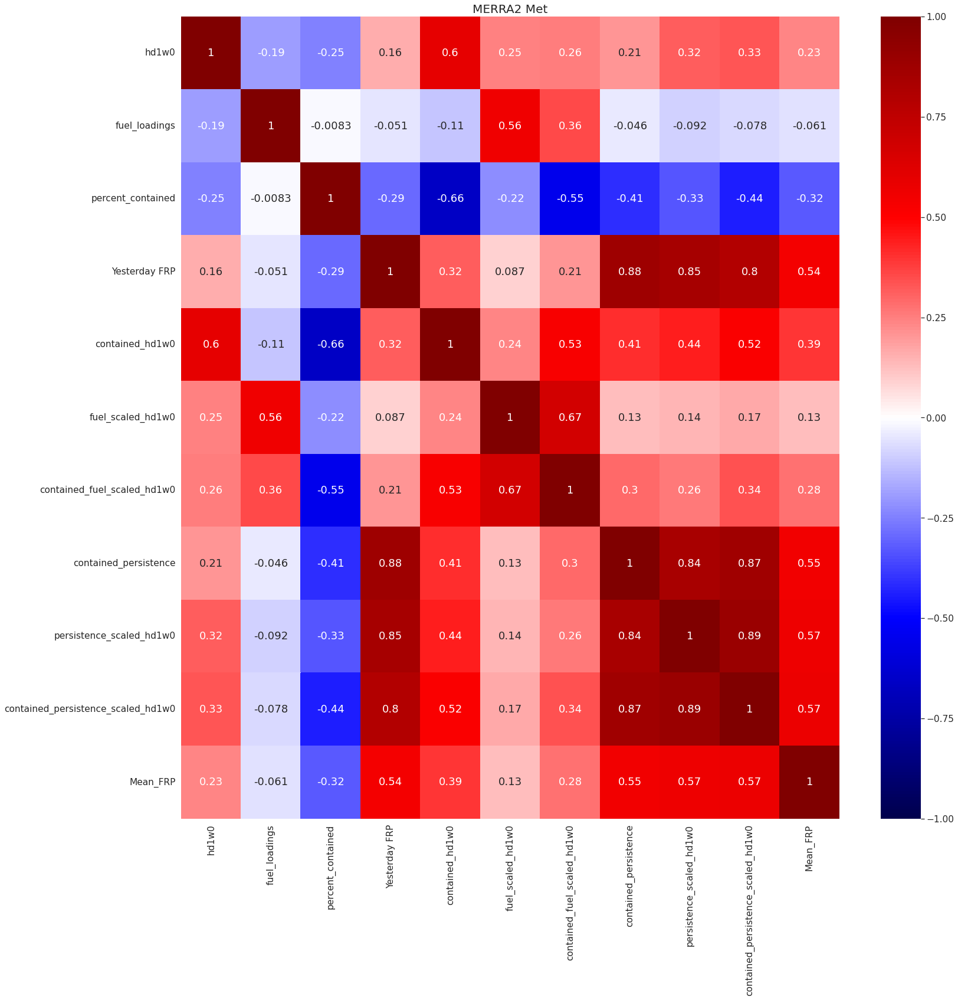

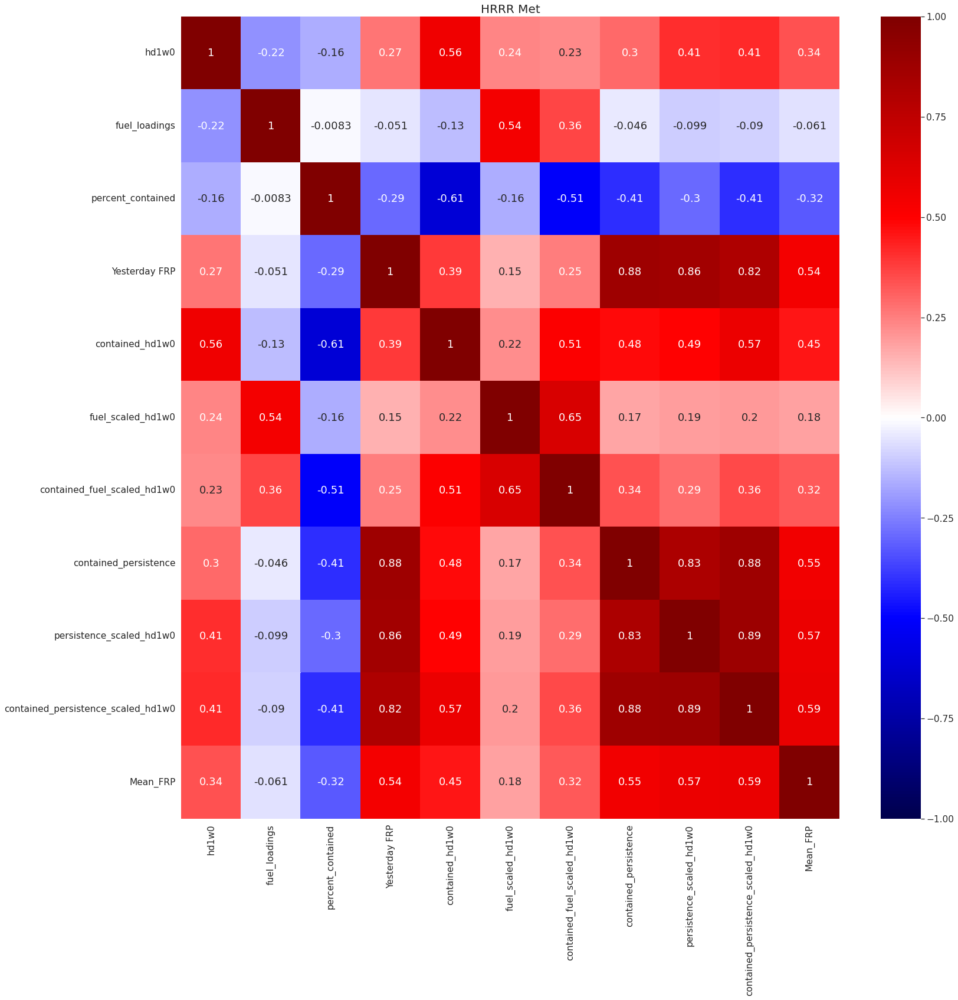

In [34]:
#for the October 31st Research Update
plot_correlations(df_merra[['hd1w0','fuel_loadings','percent_contained','Yesterday FRP',
                            'contained_hd1w0','fuel_scaled_hd1w0','contained_fuel_scaled_hd1w0',
                            'contained_persistence', 'persistence_scaled_hd1w0','contained_persistence_scaled_hd1w0',
                            'Mean_FRP']], 
                          'MERRA2 Met','kendall')
plot_correlations(df_hrrr[['hd1w0','fuel_loadings','percent_contained','Yesterday FRP',
                            'contained_hd1w0','fuel_scaled_hd1w0','contained_fuel_scaled_hd1w0',
                            'contained_persistence', 'persistence_scaled_hd1w0','contained_persistence_scaled_hd1w0',
                            'Mean_FRP']], 
                  'HRRR Met','kendall')

## Box and whisker plots

In [101]:
print(df_hrrr.columns)

Index(['day', 'temp_2m', 'vpd_2m', 'wind_speed', 'hd0w0', 'hd1w0', 'hd2w0',
       'hd3w0', 'hd4w0', 'hd5w0', 'hwp', 'PWS', 'ESI',
       'Dominant Fuel Category', 'Dominant Simple Fuel Category', 'forest',
       'savanna', 'grassland', 'name', 'personnel', 'percent_contained',
       'fuel_loadings', 'fire area (acre)', 'Mean_FRP', 'Yesterday FRP',
       'ESI Category', 'PWS Category', 'Containment Category',
       'hd1w0_predicted_FRP', 'contained_hd1w0', 'total_fuel',
       'total_fuel_log', 'fuel_scaled_hd1w0', 'contained_fuel_scaled_hd1w0',
       'point_type'],
      dtype='object')


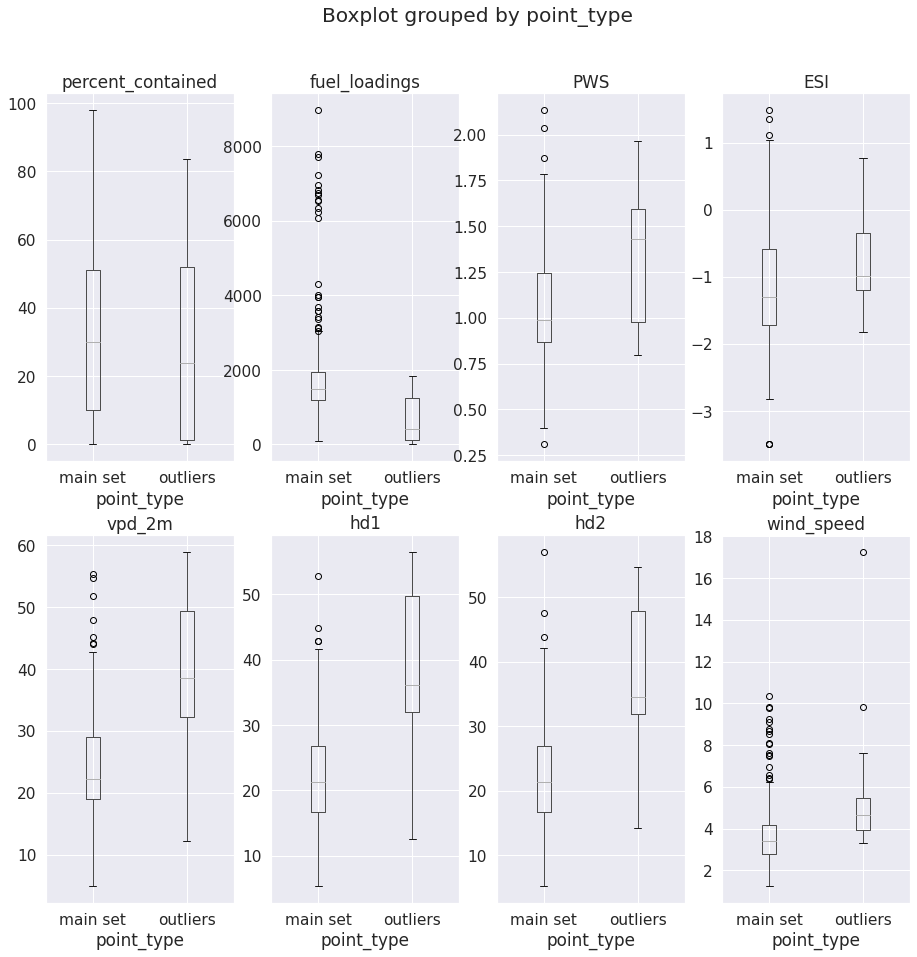

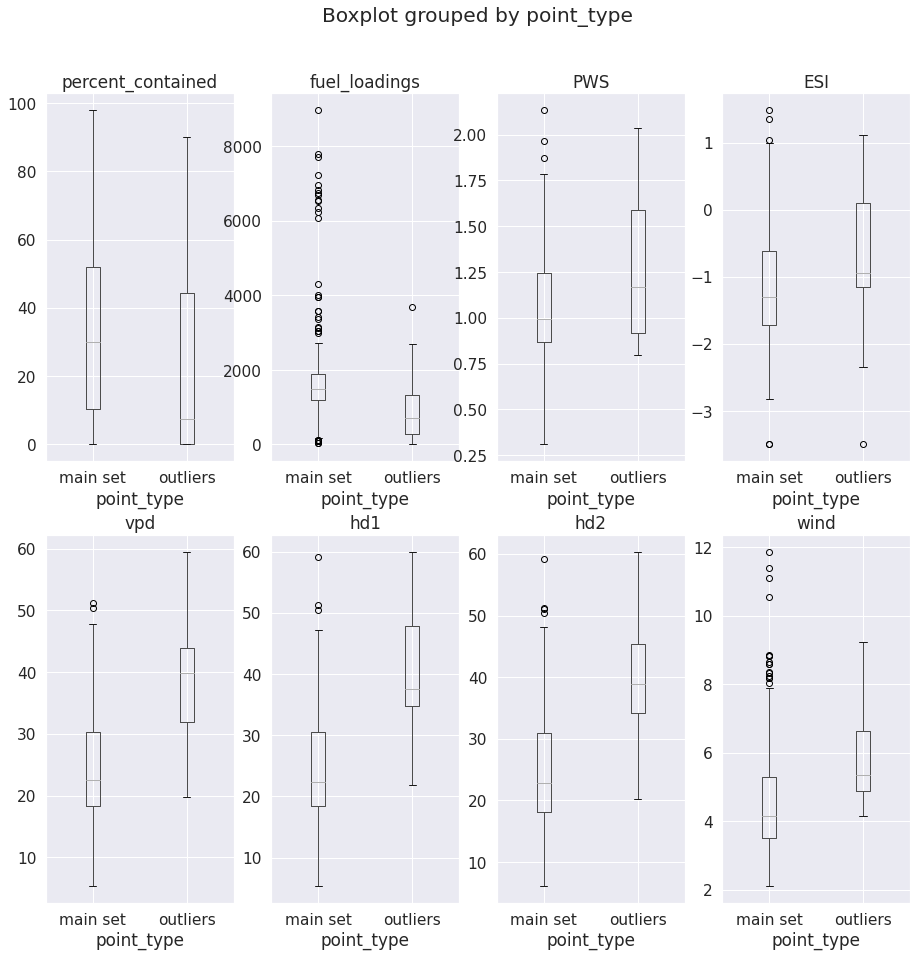

In [27]:
varis_hrrr = ['percent_contained','fuel_loadings','PWS', 'ESI','vpd_2m','hd1','hd2','wind_speed']
fig, axs = plt.subplots(2,4,figsize=(15,  15), sharey=False)
df_hrrr.boxplot(varis_hrrr, 'point_type', axs)
plt.show()

varis_merra = ['percent_contained','fuel_loadings','PWS', 'ESI','vpd','hd1','hd2','wind']
fig, axs = plt.subplots(2,4,figsize=(15,  15), sharey=False)
df_merra.boxplot(varis_merra, 'point_type', axs)
plt.show()

# Testing

In [ ]:
df_merra['model_name'] = ['MERRA2']*len(df_merra)
df_hrrr['model_name'] = ['HRRR']*len(df_merra)
df_all = pd.concat([df_hrrr,df_merra])

df_merra_filtered['model_name'] = ['MERRA2']*len(df_merra_filtered)
df_hrrr_filtered['model_name'] = ['HRRR']*len(df_hrrr_filtered)
df_all_filtered = pd.concat([df_hrrr_filtered,df_merra_filtered])

#percent contained
sns.relplot(
    data=df_all_filtered, x="hd1w0", y="Mean_FRP",
    col="model_name", hue="percent_contained", style="name",s=650,
    kind="scatter", height=15
)
plt.show()

#personnel
sns.relplot(
    data=df_all_filtered, x="hd1w0", y="Mean_FRP",
    col="model_name", hue="personnel", style="name",size='personnel',sizes=(100,600),
    kind="scatter", height=15
)
plt.show()

#PWS
sns.relplot(
    data=df_all_filtered, x="hd1w0", y="Mean_FRP",
    col="model_name", hue="PWS", style="name",size='percent_contained',sizes=(100,600),
    kind="scatter", height=15
)
plt.show()

#ESI
sns.relplot(
    data=df_all_filtered, x="hd1w0", y="Mean_FRP",
    col="model_name", hue="ESI", style="name",size='percent_contained',sizes=(100,600),
    kind="scatter", height=15,palette = 'vlag'
)
plt.show()


#ESI
sns.relplot(
    data=df_all_filtered, x="hd1w0", y="Mean_FRP",
    col="model_name", hue="Yesterday FRP", style="name",size='Yesterday FRP',sizes=(100,600),
    kind="scatter", height=15
)
plt.show()

In [ ]:
#ESI
sns.relplot(
    data=df_all, x="hd1w0", y="Mean_FRP",
    col="model_name", hue="ESI", style="name",size='percent_contained',sizes=(100,600),
    kind="scatter", height=15,palette = 'vlag'
)
plt.show()